# **Introduction**

Our goal is to predict the popularity of songs within a Spotify dataset. This task involves developing a predictive model to identify the key factors contributing to a song's popularity on the platform.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import re
import ast
from scipy import stats
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from scipy.stats import uniform, randint
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error , r2_score,accuracy_score,mean_absolute_error
import plotly.express as px
from sklearn.feature_selection import SelectKBest, f_regression, chi2, mutual_info_regression,f_classif
!pip install category_encoders
from scipy.stats import pearsonr, spearmanr
from category_encoders import TargetEncoder
from sklearn.preprocessing import LabelEncoder
import ast
pd.set_option('display.max_colwidth', None)

In [2]:
df=pd.read_csv("Downloads//SongPopularity.csv")
pd.set_option('display.max_columns', None)
df.head()

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
0,I Need You,I Need You,1/30/2001,['LeAnn Rimes'],"['country dawn', 'contemporary country', 'country road', 'country']",2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,62,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4
1,Sweet Lady,Tyrese,8/31/1998,['Tyrese'],"['hip pop', 'contemporary r&b', 'urban contemporary', 'r&b']",1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,63,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4
2,You Take My Breath Away - Mono Version,Sooner or Later,1979,['Rex Smith'],['bubblegum pop'],1979,86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6DqB9N8D,https://i.scdn.co/image/ab67616d00001e02d1741c9f06876cb631c9646e,spotify:track:3BCMsz55asr7Yr6DqB9N8D,49,0.4760,0.313,0.600,0.000026,0.523,-7.913,0.0357,141.912,0.272,11,1,4
3,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),1945,"['Doris Day', 'The Mellomen']","['adult standards', 'easy listening', 'movie tunes', 'vocal jazz', 'lounge']",1954,20,169066,https://open.spotify.com/track/20G1XJaTwIm2IuwA3Pjg1d,https://i.scdn.co/image/ab67616d00001e02f2ee02ef38c965d5ebe540fa,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,43,0.9730,0.503,0.059,0.000000,0.103,-16.131,0.0497,76.642,0.331,9,1,4
4,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,8/16/2011,['The Karaoke Crew'],['karaoke'],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,0.0149,0.843,0.348,0.001280,0.247,-10.669,0.0545,143.595,0.385,7,0,4


**Hot100 Ranking Year:** The year in which the song achieved its ranking on the Billboard Hot 100 chart.

**Hot100 Rank:** The specific ranking of the song on the Billboard Hot 100 chart during a particular year.

**Acousticness:** tells us how much of a song is made with real instruments versus electronic ones: higher numbers mean more real instruments, while lower numbers mean more electronic sounds.

**Danceability:** measures how easy it is to dance to a song: higher values mean it's easier to dance to, while lower values mean it might be harder to dance to.

**Energy:** A measure of the song's intensity and activity, often associated with loudness and speed.

**Instrumentalness:** Indicates the presence of vocals vs. instrumental elements in the song.

**Liveness:** Reflects the likelihood of the song being performed live, based on audience noises and crowd sounds.

**Speechiness:** Measures the presence of spoken words or speech-like elements in the song.

**Tempo:** The speed or pace of the song, typically measured in beats per minute (BPM).

**Valence:** Describes the musical positiveness conveyed by the song, such as happiness or cheerfulness.

**Key:** The musical key or tonality of the song, which influences its mood and sound.

**Time Signature:** Specifies the number of beats in each bar and the type of note that receives one beat, defining the song's rhythmic structure.

# **Data Preprocessing**

In [3]:
df.shape

(6191, 24)

In [4]:
list(df.columns)

['Song',
 'Album',
 'Album Release Date',
 'Artist Names',
 'Artist(s) Genres',
 'Hot100 Ranking Year',
 'Hot100 Rank',
 'Song Length(ms)',
 'Spotify Link',
 'Song Image',
 'Spotify URI',
 'Popularity',
 'Acousticness',
 'Danceability',
 'Energy',
 'Instrumentalness',
 'Liveness',
 'Loudness',
 'Speechiness',
 'Tempo',
 'Valence',
 'Key',
 'Mode',
 'Time Signature']

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6191 entries, 0 to 6190
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Song                 6191 non-null   object 
 1   Album                6191 non-null   object 
 2   Album Release Date   6191 non-null   object 
 3   Artist Names         6191 non-null   object 
 4   Artist(s) Genres     6191 non-null   object 
 5   Hot100 Ranking Year  6191 non-null   int64  
 6   Hot100 Rank          6191 non-null   int64  
 7   Song Length(ms)      6191 non-null   int64  
 8   Spotify Link         6191 non-null   object 
 9   Song Image           6191 non-null   object 
 10  Spotify URI          6191 non-null   object 
 11  Popularity           6191 non-null   int64  
 12  Acousticness         6191 non-null   float64
 13  Danceability         6191 non-null   float64
 14  Energy               6191 non-null   float64
 15  Instrumentalness     6191 non-null   f

All datatypes are correct

In [6]:
df.describe().round(2)

,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
count,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00,6191.00
mean,1987.85,48.32,224626.54,54.12,0.30,0.62,0.60,0.05,0.18,-8.72,0.07,119.01,0.60,5.24,0.71,3.94
std,20.35,29.19,64360.37,21.51,0.29,0.16,0.21,0.17,0.15,3.77,0.08,28.22,0.24,3.58,0.46,0.32
min,1946.00,1.00,51800.00,0.00,0.00,0.00,0.01,0.00,0.02,-37.84,0.00,0.00,0.00,0.00,0.00,0.00
25%,1971.00,23.00,181759.50,42.00,0.05,0.52,0.46,0.00,0.09,-11.12,0.03,97.85,0.40,2.00,0.00,4.00
50%,1988.00,47.00,220734.00,58.00,0.20,0.63,0.62,0.00,0.12,-8.13,0.04,117.91,0.61,5.00,1.00,4.00
75%,2005.00,74.00,257113.00,70.00,0.51,0.73,0.76,0.00,0.23,-5.79,0.07,134.90,0.80,8.00,1.00,4.00
max,2022.00,100.00,1561133.00,94.00,1.00,0.99,1.00,0.97,0.98,-0.81,0.91,232.47,0.99,11.00,1.00,5.00


**Hot100 Ranking Year:** The ranking years range between 2010 and 2020
    
**Hot100 Rank:** The average rank is 50.5 and There are no missing values.
    
**Popularity:** The average popularity score is 66.4
    
**Energy:** The minimum energy value is 0.0112, the maximum energy value is 0.996.
    
**Instrumentalness:** The average instrumentalness value is 0.117.
    
**Liveness:** The liveness value ranges from 0.0158 to 0.995.
    
**Loudness:** The minimum loudness value is -14.874, the maximum loudness value is 5.787.
    
**Acousticness:** The most acoustic songs tend to have an acousticness score of 0.8 or higher.
    
**Danceability:** The distribution of danceability scores is approximately normal, with a slight skew to the right.
    
**Key:** The distribution of key scores is approximately uniform.
    
**Speechiness:** The distribution of speechiness scores is skewed to the right.
    
**Tempo:** The fastest songs tend to have a tempo score of 120 or higher.
    
**Valence:** The minimum valence score is 0.0337, the maximum valence score is 0.982.
    
**Time Signature:** The average time signature is 4.0.
    
**Mode:** There are two modes in the dataset: "Major" and "Minor"and the most common mode is "Major", which appears 61 times in the dataset.

In [7]:
df.isnull().sum()

Song                   0
Album                  0
Album Release Date     0
Artist Names           0
Artist(s) Genres       0
Hot100 Ranking Year    0
Hot100 Rank            0
Song Length(ms)        0
Spotify Link           0
Song Image             0
Spotify URI            0
Popularity             0
Acousticness           0
Danceability           0
Energy                 0
Instrumentalness       0
Liveness               0
Loudness               0
Speechiness            0
Tempo                  0
Valence                0
Key                    0
Mode                   0
Time Signature         0
dtype: int64

In [8]:
df.duplicated().sum()

0

No null or duplicated values

### Exploring unique values of some features

In [9]:
df['Mode'].unique()

array([1, 0], dtype=int64)

In [10]:
df['Hot100 Ranking Year'].unique()

array([2000, 1999, 1979, 1954, 2006, 1995, 1991, 2002, 2007, 1988, 2011,
       1986, 1961, 1966, 1982, 2020, 2012, 2010, 1980, 1994, 1974, 1956,
       1962, 1963, 1960, 1969, 2008, 1947, 1958, 1970, 1981, 2017, 1950,
       1972, 1998, 1977, 1978, 1996, 2015, 1976, 1992, 1990, 2001, 2004,
       1968, 1965, 2009, 1989, 2013, 1967, 1997, 1964, 1983, 2003, 1955,
       2014, 1971, 1985, 1993, 2016, 1953, 1952, 1973, 1948, 2019, 1975,
       1946, 2022, 2018, 1951, 2021, 1957, 1984, 1987, 2005, 1959, 1949],
      dtype=int64)

In [11]:
df['Key'].unique()

array([ 7,  9, 11,  4,  5,  2,  6,  3,  1,  0,  8, 10], dtype=int64)

In [12]:
df['Time Signature'].unique()

array([4, 3, 1, 5, 0], dtype=int64)

In [13]:
df['Artist Names'].value_counts()

Artist Names
['The Karaoke Channel']                                                                        42
['Madonna']                                                                                    28
['Janet Jackson']                                                                              26
['Taylor Swift']                                                                               25
['Elvis Presley']                                                                              24
                                                                                               ..
['Dustin Lynch']                                                                                1
['Bing Crosby', 'John Scott Trotter & His Orchestra', 'The Charioteers', 'The Rhythmaires']     1
['Roger Alan Wade']                                                                             1
['2 Chainz', 'Drake']                                                                           1
['Fort 

In the dataset, many artists have multiple songs, and the artist with the highest contribution is 'The Karaoke Channel' with 42 songs. Following them are 'Madonna' and 'Janet Jackson' with their respective song counts.

In [14]:
album_counts = df['Album'].value_counts()
multiple_occurrences = album_counts[album_counts > 1]
print(multiple_occurrences)

Album
Greatest Hits                                                   48
Super Hits                                                      13
16 Most Requested Songs                                         10
The Definitive Collection                                       10
Celebration (double disc version)                                9
                                                                ..
Ultimate Oldies & Goodies - One Hit Wonders of the 50s & 60s     2
Above The Clouds - The Collection (Deluxe)                       2
I Think We're Alone Now                                          2
New Joc City                                                     2
Only By The Night                                                2
Name: count, Length: 1048, dtype: int64


For albums, the most prolific is 'Greatest Hits' with 48 entries. This is followed by 'Super Hits' and '16 Most Requested Songs', each having their own respective counts.

In [15]:
song_counts = df['Song'].value_counts()
multiple_occurrences = song_counts[song_counts > 1]
print(multiple_occurrences)

Song
Heaven                               6
I Like It                            6
To Each His Own                      5
Someday                              4
Because Of You                       4
                                    ..
You Right                            2
Someone Like You                     2
Essence (feat. Tems)                 2
Heartbreaker                         2
Damn! (feat. Lil' Jon) - Club Mix    2
Name: count, Length: 424, dtype: int64


**Many song names are duplicated!**

In [16]:
df1=df[df['Song']=='I Like It']
df1

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
2131,I Like It,Top Chart Hits from Yesterday & Today,5/19/2023,"['Cardi B', 'Bad Bunny', 'J Balvin']","['reggaeton colombiano', 'urbano latino', 'rap', 'pop', 'trap latino', 'reggaeton']",2019,69,253390,https://open.spotify.com/track/6EDKATZexSe2JVlLf7g7p4,https://i.scdn.co/image/ab67616d00001e02dbf81b927b6cec91e9fa8e54,spotify:track:6EDKATZexSe2JVlLf7g7p4,0,0.10100,0.815,0.727,0.000000,0.3720,-3.998,0.1280,136.045,0.649,5,0,4
2687,I Like It,24/7,1/1/1989,['DINO'],[],1989,56,307200,https://open.spotify.com/track/1UHXwhhhyyikWEa3h79sNF,https://i.scdn.co/image/ab67616d00001e027ae35921b7c6d349eba30ebe,spotify:track:1UHXwhhhyyikWEa3h79sNF,33,0.00384,0.786,0.659,0.010700,0.0663,-11.792,0.0919,108.288,0.935,4,0,4
2693,I Like It,Euphoria (Standard US/Latin version),1/1/2010,"['Enrique Iglesias', 'Pitbull']","['dance pop', 'miami hip hop', 'mexican pop', 'pop', 'latin pop']",1997,97,231786,https://open.spotify.com/track/4nVyHATevhl5RC6Qmoko5H,https://i.scdn.co/image/ab67616d00001e0261b07d8471f34aa6616eaf21,spotify:track:4nVyHATevhl5RC6Qmoko5H,67,0.02090,0.646,0.940,0.000000,0.0691,-2.856,0.0838,129.011,0.704,10,0,4
3162,I Like It,Top Chart Hits from Yesterday & Today,5/19/2023,"['Cardi B', 'Bad Bunny', 'J Balvin']","['reggaeton colombiano', 'urbano latino', 'rap', 'pop', 'trap latino', 'reggaeton']",2018,7,253390,https://open.spotify.com/track/6EDKATZexSe2JVlLf7g7p4,https://i.scdn.co/image/ab67616d00001e02dbf81b927b6cec91e9fa8e54,spotify:track:6EDKATZexSe2JVlLf7g7p4,0,0.10100,0.815,0.727,0.000000,0.3720,-3.998,0.1280,136.045,0.649,5,0,4
4174,I Like It,Euphoria (Standard US/Latin version),1/1/2010,"['Enrique Iglesias', 'Pitbull']","['mexican pop', 'dance pop', 'miami hip hop', 'pop', 'latin pop']",2010,12,231786,https://open.spotify.com/track/4nVyHATevhl5RC6Qmoko5H,https://i.scdn.co/image/ab67616d00001e0261b07d8471f34aa6616eaf21,spotify:track:4nVyHATevhl5RC6Qmoko5H,67,0.02090,0.646,0.940,0.000000,0.0691,-2.856,0.0838,129.011,0.704,10,0,4
4546,I Like It,From The Bottom To The Top,1/1/2000,"['Sammie', 'JT Money']","['hip pop', 'miami hip hop', 'urban contemporary', 'dirty south rap', 'r&b']",2000,91,251040,https://open.spotify.com/track/0IvTGWbNnCiUi9IOF7ye3F,https://i.scdn.co/image/ab67616d00001e021f6efa6ca802629b56e6614b,spotify:track:0IvTGWbNnCiUi9IOF7ye3F,49,0.01010,0.826,0.656,0.000113,0.0272,-8.529,0.0617,129.963,0.852,9,1,4


Song names are duplicated but not all links are

In [17]:
df1['Spotify Link'].unique()

array(['https://open.spotify.com/track/6EDKATZexSe2JVlLf7g7p4',
       'https://open.spotify.com/track/1UHXwhhhyyikWEa3h79sNF',
       'https://open.spotify.com/track/4nVyHATevhl5RC6Qmoko5H',
       'https://open.spotify.com/track/0IvTGWbNnCiUi9IOF7ye3F'],
      dtype=object)

In [18]:
link_counts = df['Spotify Link'].value_counts()
link_multiple_occurrences = link_counts[link_counts > 1]
print(link_multiple_occurrences)

Spotify Link
https://open.spotify.com/track/4ZtFanR9U6ndgddUvNcjcG    3
https://open.spotify.com/track/0mmveflIg5uKskiCOdRV3e    3
https://open.spotify.com/track/0bYg9bo50gSsH3LtXe2SQn    3
https://open.spotify.com/track/1aJnGme5ZRltYTp8FJ52eZ    3
https://open.spotify.com/track/4YCnTYbq3oL1Lqpyxg33CU    3
                                                        ..
https://open.spotify.com/track/1Lim1Py7xBgbAkAys3AGAG    2
https://open.spotify.com/track/1Ov37jtRQ2YNAe8HzfczkL    2
https://open.spotify.com/track/48l7PNpT2fBoT4cdLW6EzP    2
https://open.spotify.com/track/43bCmCI0nSgcT7QdMXY6LV    2
https://open.spotify.com/track/2cSSQk3AKWtIEymc4e5yPf    2
Name: count, Length: 265, dtype: int64


In [19]:
duplicate_links = df[df.duplicated(subset=['Spotify Link'], keep=False)]
duplicate_links

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
5,Always,Cross Road,10/18/1994,['Bon Jovi'],"['glam metal', 'rock']",1995,17,353026,https://open.spotify.com/track/2RChe0r2cMoyOvuKobZy44,https://i.scdn.co/image/ab67616d00001e025f66fbeaff0725997250591c,spotify:track:2RChe0r2cMoyOvuKobZy44,77,0.11700,0.383,0.659,0.000000,0.0778,-5.558,0.0312,140.795,0.327,4,1,4
23,Another Night,Another Night,3/28/1995,['Real McCoy'],"['german techno', 'hip house', 'diva house', 'eurodance']",1994,63,236933,https://open.spotify.com/track/3pEuO9J2MTEmec8kUfYYvl,https://i.scdn.co/image/ab67616d00001e0226b65044d82b81a249e396f5,spotify:track:3pEuO9J2MTEmec8kUfYYvl,65,0.09080,0.813,0.882,0.004570,0.1470,-7.575,0.0402,125.983,0.874,7,1,4
26,"Moves Like Jagger - Studio Recording From ""The Voice"" Performance",Hands All Over,2010,"['Maroon 5', 'Christina Aguilera']","['pop', 'dance pop']",2012,36,201160,https://open.spotify.com/track/7LcfRTgAVTs5pQGEQgUEzN,https://i.scdn.co/image/ab67616d00001e02ce70cb2d7063cf869f9f1239,spotify:track:7LcfRTgAVTs5pQGEQgUEzN,74,0.01110,0.722,0.758,0.000000,0.3080,-4.477,0.0471,128.047,0.620,11,0,4
32,lately - Demo,lately (Demo),12/7/2022,['Divine Simisi'],[],1999,31,212509,https://open.spotify.com/track/0cv9WHEizHUkZAo0kXorgA,https://i.scdn.co/image/ab67616d00001e025bfba4555394d8ba353d7945,spotify:track:0cv9WHEizHUkZAo0kXorgA,0,0.94500,0.727,0.137,0.000000,0.3810,-14.116,0.1770,85.299,0.205,0,1,3
34,Ole Buttermilk Sky,The Best Of Kay Kyser and His Orchestra,5/9/2000,['Kay Kyser & His Orchestra'],"[""man's orchestra""]",1947,35,177506,https://open.spotify.com/track/1M2NFzR0gAeDt8yIHuqlaQ,https://i.scdn.co/image/ab67616d00001e02fa9fab792e87b717952b001a,spotify:track:1M2NFzR0gAeDt8yIHuqlaQ,20,0.97500,0.572,0.184,0.000073,0.1590,-14.434,0.0438,168.596,0.829,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6111,My Humps - Originally Performed By Black Eyed Peas,40 Super Hits Karaoke: Ultimate Hits V2,12/11/2011,['B the Star'],[],2006,42,309865,https://open.spotify.com/track/0T6lVd2JSk7R803PfCXFJS,https://i.scdn.co/image/ab67616d00001e0298c8e373e03823b973ae901a,spotify:track:0T6lVd2JSk7R803PfCXFJS,0,0.00100,0.855,0.487,0.825000,0.1760,-13.717,0.0998,124.040,0.379,1,1,4
6121,If I Loved You,Imagination,1982,['Dick Haymes'],"['swing', 'deep adult standards', 'british dance band']",1946,29,119840,https://open.spotify.com/track/1938FeAi8kI7w9TpbgQWgP,https://i.scdn.co/image/ab67616d00001e028e71eb4be67203cf16342418,spotify:track:1938FeAi8kI7w9TpbgQWgP,55,0.98000,0.000,0.214,0.916000,0.1200,-18.376,0.0000,0.000,0.000,10,0,0
6166,SICKO MODE,ASTROWORLD,8/3/2018,['Travis Scott'],"['slap house', 'rap', 'hip hop']",2018,42,312820,https://open.spotify.com/track/2xLMifQCjDGFmkHkpNLD9h,https://i.scdn.co/image/ab67616d00001e02072e9faef2ef7b6db63834a3,spotify:track:2xLMifQCjDGFmkHkpNLD9h,85,0.00513,0.834,0.730,0.000000,0.1240,-3.714,0.2220,155.008,0.446,8,1,4
6170,I Gotta Feeling,Mega Hits 2010,2/1/2023,['The Black Eyed Peas'],[],2010,29,289493,https://open.spotify.com/track/1NYjuVSkHaYK7QAIvs7lrF,https://i.scdn.co/image/ab67616d00001e02929c1c69cd0f076d53a24bf7,spotify:track:1NYjuVSkHaYK7QAIvs7lrF,25,0.05190,0.746,0.793,0.000000,0.4210,-5.725,0.0265,127.973,0.656,0,1,4


### If a link appears more than once but with different top 100 ranking years, it may not be an issue since the song could be featured in multiple significant song lists across different years. However, if the top 100 ranking years are identical for duplicated links, it presents a conflict for the model. This is uncommon because a song typically shouldn't have multiple rankings in the same year. Therefore, I will investigate rows where both the link and top 100 ranking year are duplicated. ###


In [20]:
duplicate_links = df[df.duplicated(subset=['Spotify Link', 'Hot100 Ranking Year'], keep=False)]
duplicate_links.shape[0]

12

In [21]:
duplicate_links

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
385,Moonglow and Theme from Picnic,The Magic Of Manuel,1991,['Manuel & The Music Of The Mountains'],"['light music', 'easy listening']",1956,11,224800,https://open.spotify.com/track/2ALPECYsOxZ0qQlxnQPlj6,https://i.scdn.co/image/ab67616d00001e02ce0a9919edc5de493f1e28b7,spotify:track:2ALPECYsOxZ0qQlxnQPlj6,40,0.7450,0.228,0.346,0.881000,0.1850,-10.995,0.0309,81.718,0.119,2,1,4
582,The Twist,Dancin' Party: The Chubby Checker Collection (1960-1966),6/19/2020,['Chubby Checker'],"['rockabilly', 'rock-and-roll']",1962,9,155040,https://open.spotify.com/track/4YCnTYbq3oL1Lqpyxg33CU,https://i.scdn.co/image/ab67616d00001e02d3eefe1def522fa7598f717e,spotify:track:4YCnTYbq3oL1Lqpyxg33CU,63,0.1800,0.571,0.618,0.000003,0.1780,-5.682,0.0371,156.892,0.852,4,1,4
773,I'm Looking Over A Four Leaf Clover (Jazz Samba),Desafinado,1/1/1997,['Coleman Hawkins'],"['jazz', 'jazz saxophone', 'bebop']",1948,33,173160,https://open.spotify.com/track/1wqrfKgBPtCHITqSwwXcxf,https://i.scdn.co/image/ab67616d00001e0211d73b1e57790b5f47b144cc,spotify:track:1wqrfKgBPtCHITqSwwXcxf,43,0.7610,0.618,0.195,0.036300,0.0744,-16.262,0.1420,84.605,0.812,5,1,4
1056,Moonglow and Theme from Picnic,The Magic Of Manuel,1991,['Manuel & The Music Of The Mountains'],"['light music', 'easy listening']",1956,31,224800,https://open.spotify.com/track/2ALPECYsOxZ0qQlxnQPlj6,https://i.scdn.co/image/ab67616d00001e02ce0a9919edc5de493f1e28b7,spotify:track:2ALPECYsOxZ0qQlxnQPlj6,40,0.7450,0.228,0.346,0.881000,0.1850,-10.995,0.0309,81.718,0.119,2,1,4
1778,The Twist,Dancin' Party: The Chubby Checker Collection (1960-1966),6/19/2020,['Chubby Checker'],"['rockabilly', 'rock-and-roll']",1962,17,155040,https://open.spotify.com/track/4YCnTYbq3oL1Lqpyxg33CU,https://i.scdn.co/image/ab67616d00001e02d3eefe1def522fa7598f717e,spotify:track:4YCnTYbq3oL1Lqpyxg33CU,63,0.1800,0.571,0.618,0.000003,0.1780,-5.682,0.0371,156.892,0.852,4,1,4
2558,(God Must Have Spent) A Little More Time On You - Remix,'N Sync UK Version,1997,['*NSYNC'],"['dance pop', 'boy band', 'pop']",1999,100,241493,https://open.spotify.com/track/08zfRiERqpy7J0x8akk7zt,https://i.scdn.co/image/ab67616d00001e02186b235052f031900c5cb282,spotify:track:08zfRiERqpy7J0x8akk7zt,55,0.4490,0.375,0.527,0.000000,0.3050,-8.422,0.0507,167.242,0.303,10,1,4
2728,Glamorous,The Dutchess,9/13/2006,"['Fergie', 'Ludacris']","['southern hip hop', 'dance pop', 'rap', 'dirty south rap', 'trap', 'old school atlanta hip hop', 'pop', 'atl hip hop', 'hip hop', 'pop rap']",2007,19,246573,https://open.spotify.com/track/4KTtYhxFtFL7mBwnjkKfLm,https://i.scdn.co/image/ab67616d00001e020283b8c1365d34315f5807bf,spotify:track:4KTtYhxFtFL7mBwnjkKfLm,72,0.2910,0.810,0.755,0.000000,0.0857,-6.408,0.1990,130.991,0.625,0,1,4
2737,(God Must Have Spent) A Little More Time On You - Remix,'N Sync UK Version,1997,['*NSYNC'],"['dance pop', 'boy band', 'pop']",1999,45,241493,https://open.spotify.com/track/08zfRiERqpy7J0x8akk7zt,https://i.scdn.co/image/ab67616d00001e02186b235052f031900c5cb282,spotify:track:08zfRiERqpy7J0x8akk7zt,55,0.4490,0.375,0.527,0.000000,0.3050,-8.422,0.0507,167.242,0.303,10,1,4
3457,I'm Looking Over A Four Leaf Clover (Jazz Samba),Desafinado,1/1/1997,['Coleman Hawkins'],"['jazz', 'jazz saxophone', 'bebop']",1948,10,173160,https://open.spotify.com/track/1wqrfKgBPtCHITqSwwXcxf,https://i.scdn.co/image/ab67616d00001e0211d73b1e57790b5f47b144cc,spotify:track:1wqrfKgBPtCHITqSwwXcxf,43,0.7610,0.618,0.195,0.036300,0.0744,-16.262,0.1420,84.605,0.812,5,1,4
4579,What's Luv? (feat. Ja-Rule & Ashanti),Jealous Ones Still Envy (J.O.S.E),12/4/2001,"['Fat Joe', 'Ja Rule', 'Ashanti']","['gangster rap', 'hip pop', 'dance pop', 'urban contemporary', 'queens hip hop', 'east coast hip hop', 'hardcore hip hop', 'rap', 'dirty so

Since there are only 12 rows where both the top 100 ranking year and the link are duplicated, I will drop these rows from the dataset.


In [22]:

df.drop_duplicates(subset=['Spotify Link', 'Hot100 Ranking Year'], keep=False, inplace=True)

df.reset_index(drop=True, inplace=True)

In [23]:
duplicate_links = df[df.duplicated(subset=['Spotify Link'], keep=False)]
duplicate_links.shape[0]

525

In [24]:
link_counts = df['Spotify URI'].value_counts()
link_multiple_occurrences = link_counts[link_counts > 1]
print(link_multiple_occurrences)

Spotify URI
spotify:track:7BqBn9nzAq8spo5e7cZ0dJ    3
spotify:track:0bYg9bo50gSsH3LtXe2SQn    3
spotify:track:1aJnGme5ZRltYTp8FJ52eZ    3
spotify:track:0mmveflIg5uKskiCOdRV3e    3
spotify:track:2NDMLabAjx4oL7ezx2PNxS    3
                                       ..
spotify:track:0T6lVd2JSk7R803PfCXFJS    2
spotify:track:1mXVgsBdtIVeCLJnSnmtdV    2
spotify:track:37vVp2sWHuuIBOSl1NswP6    2
spotify:track:3hb2ScEVkGchcAQqrPLP0R    2
spotify:track:43LdgobPlcCc5g9Kmactvy    2
Name: count, Length: 259, dtype: int64


In [25]:
df['Hot100 Ranking Year'].value_counts()

Hot100 Ranking Year
2017    96
1974    96
2015    95
1998    95
1963    95
        ..
1949    28
1951    27
1952    26
1950    26
1955    25
Name: count, Length: 77, dtype: int64

In [26]:
df['Album'].value_counts()

Album
Greatest Hits                        48
Super Hits                           13
16 Most Requested Songs              10
The Definitive Collection            10
Celebration (double disc version)     9
                                     ..
Blacks' Magic                         1
Circles Around This Town              1
Lonely Weekends (Remastered 2022)     1
Time                                  1
Little Voice                          1
Name: count, Length: 4517, dtype: int64

The majority of songs appear to have rankings in the mid to high 90s, particularly in 2017 and 1974. This suggests that these years might have had a higher number of popular or significant songs. On the other hand, earlier years like 1955, 1950, and 1952 show lower rankings, indicating fewer popular songs or possibly a smaller dataset for those years.


### Handling Some Hidden Nulls

Nulls in Artists' Genres are represented as "[]" in the dataset.

In [27]:
df[df['Artist(s) Genres'].isin(["[]"])].head()

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
21,Meet Me Halfway,Pov- you give me butterflies,1/31/2023,['The Black Eyed Peas'],[],2010,58,284386,https://open.spotify.com/track/2wgT2kmeRHkulsMfreGqXE,https://i.scdn.co/image/ab67616d00001e02c9065a21f537c0df9db371f5,spotify:track:2wgT2kmeRHkulsMfreGqXE,26,0.00442,0.799,0.629,0.000039,0.301,-6.844,0.0949,130.008,0.392,11,0,4
29,Washington Square,The Original Washington Square,11/26/1963,['The Village Stompers'],[],1963,75,162333,https://open.spotify.com/track/2JwLfiU13mnYuiqcqriOLl,https://i.scdn.co/image/ab67616d00001e02810666f15e51bdde8b301fa5,spotify:track:2JwLfiU13mnYuiqcqriOLl,29,0.56500,0.801,0.301,0.140000,0.214,-12.197,0.0464,119.916,0.769,4,0,4
32,lately - Demo,lately (Demo),12/7/2022,['Divine Simisi'],[],1999,31,212509,https://open.spotify.com/track/0cv9WHEizHUkZAo0kXorgA,https://i.scdn.co/image/ab67616d00001e025bfba4555394d8ba353d7945,spotify:track:0cv9WHEizHUkZAo0kXorgA,0,0.94500,0.727,0.137,0.000000,0.381,-14.116,0.1770,85.299,0.205,0,1,3
36,"It's Not Unusual/For The Love Of Him - Medley/Live On The Ed Sullivan Show, December 6, 1970","It's Not Unusual/For The Love Of Him (Medley/Live On The Ed Sullivan Show, December 6, 1970)",11/12/2021,['Bobbi Martin'],[],1970,77,87987,https://open.spotify.com/track/1hzRlAoXbslnQNqfSyAbKk,https://i.scdn.co/image/ab67616d00001e020414924c484b78328c0e6444,spotify:track:1hzRlAoXbslnQNqfSyAbKk,1,0.40100,0.477,0.495,0.000000,0.829,-11.936,0.0484,104.930,0.871,5,1,4
46,Are You Jimmy Ray?,Jimmy Ray,3/10/1998,['Jimmy Ray'],[],1998,65,201200,https://open.spotify.com/track/6VWFrHAnLDyNUEJbJvpkZA,https://i.scdn.co/image/ab67616d00001e02d0929fb55805cfc96298c12e,spotify:track:6VWFrHAnLDyNUEJbJvpkZA,38,0.13000,0.750,0.914,0.000023,0.392,-5.707,0.0704,99.083,0.673,10,0,4


In [28]:
df['Artist(s) Genres'].isin(["[]"]).sum()

394

Filling null values in the Artists' Genres, which is categorical data, with the mode is a suitable approach. This will replace missing values with the most frequently occurring genre in the dataset.

In [29]:
df['Artist(s) Genres'] = df['Artist(s) Genres'].apply(lambda x: np.nan if x == "[]" else x)
mode_value = df['Artist(s) Genres'].mode()[0]
df['Artist(s) Genres'].fillna(mode_value, inplace=True)

In [30]:
print(df['Artist(s) Genres'].isin(["[]"]).sum())

0


**Checking if there any other hidden Nulls**

In [31]:
pattern = re.compile(r'[^a-zA-Z\s]')
df[df['Song'].str.contains(pattern, na=False)].head()

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
2,You Take My Breath Away - Mono Version,Sooner or Later,1979,['Rex Smith'],['bubblegum pop'],1979,86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6DqB9N8D,https://i.scdn.co/image/ab67616d00001e02d1741c9f06876cb631c9646e,spotify:track:3BCMsz55asr7Yr6DqB9N8D,49,0.4760,0.313,0.600,0.000026,0.523,-7.913,0.0357,141.912,0.2720,11,1,4
3,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),1945,"['Doris Day', 'The Mellomen']","['adult standards', 'easy listening', 'movie tunes', 'vocal jazz', 'lounge']",1954,20,169066,https://open.spotify.com/track/20G1XJaTwIm2IuwA3Pjg1d,https://i.scdn.co/image/ab67616d00001e02f2ee02ef38c965d5ebe540fa,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,43,0.9730,0.503,0.059,0.000000,0.103,-16.131,0.0497,76.642,0.3310,9,1,4
4,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,8/16/2011,['The Karaoke Crew'],['karaoke'],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,0.0149,0.843,0.348,0.001280,0.247,-10.669,0.0545,143.595,0.3850,7,0,4
8,Here (In Your Arms),Zombies! Aliens! Vampires! Dinosaurs!,8/8/2006,['Hellogoodbye'],"['pop punk', 'neon pop punk']",2007,81,240546,https://open.spotify.com/track/1GV98LUEVk1U3LWAkX2Apw,https://i.scdn.co/image/ab67616d00001e02c361d9bc9db0c6d7cdd73f49,spotify:track:1GV98LUEVk1U3LWAkX2Apw,60,0.1970,0.700,0.607,0.001730,0.272,-6.804,0.0359,126.045,0.7740,5,1,4
9,One More Try - Remastered,Faith,10/30/1987,['George Michael'],['new wave pop'],1988,11,350666,https://open.spotify.com/track/5932kbyNt445gDTT2chRUS,https://i.scdn.co/image/ab67616d00001e02b7a9a6a2bf311630d3fc6956,spotify:track:5932kbyNt445gDTT2chRUS,59,0.4340,0.551,0.291,0.000038,0.110,-12.544,0.0283,119.005,0.0823,5,1,3


In [32]:
pattern = r'^[^\w\s]+$'
HiddenNulls=df[df['Album'].str.match(pattern, na=False)]
HiddenNulls

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature
629,Moonlight,?,3/16/2018,['XXXTENTACION'],"['emo rap', 'miami hip hop']",2018,88,135090,https://open.spotify.com/track/0JP9xo3adEtGSdUEISiszL,https://i.scdn.co/image/ab67616d00001e02806c160566580d6335d1f16c,spotify:track:0JP9xo3adEtGSdUEISiszL,84,0.5560,0.921,0.537,0.004040,0.1020,-5.723,0.0804,128.009,0.711,9,0,4
1262,going down!,?,3/16/2018,['XXXTENTACION'],"['miami hip hop', 'emo rap']",1982,97,115194,https://open.spotify.com/track/7CkbRn6S0itJqcqn88AtSV,https://i.scdn.co/image/ab67616d00001e02806c160566580d6335d1f16c,spotify:track:7CkbRn6S0itJqcqn88AtSV,64,0.0216,0.873,0.663,0.000356,0.0867,-4.086,0.1500,135.499,0.525,1,1,4
2167,changes,?,3/16/2018,['XXXTENTACION'],"['emo rap', 'miami hip hop']",2018,94,121886,https://open.spotify.com/track/7AFASza1mXqntmGtbxXprO,https://i.scdn.co/image/ab67616d00001e02806c160566580d6335d1f16c,spotify:track:7AFASza1mXqntmGtbxXprO,79,0.8830,0.669,0.308,0.000000,0.0984,-10.068,0.0290,64.934,0.520,11,1,4
2976,SAD!,?,3/16/2018,['XXXTENTACION'],"['emo rap', 'miami hip hop']",2018,17,166605,https://open.spotify.com/track/3ee8Jmje8o58CHK66QrVC2,https://i.scdn.co/image/ab67616d00001e02806c160566580d6335d1f16c,spotify:track:3ee8Jmje8o58CHK66QrVC2,83,0.2580,0.740,0.613,0.003720,0.1230,-4.880,0.1450,75.023,0.473,8,1,4
3225,The A Team,+,9/9/2011,['Ed Sheeran'],"['pop', 'uk pop']",2013,75,258373,https://open.spotify.com/track/1VdZ0vKfR5jneCmWIUAMxK,https://i.scdn.co/image/ab67616d00001e02e6d489d359c546fea254f440,spotify:track:1VdZ0vKfR5jneCmWIUAMxK,76,0.6690,0.642,0.289,0.000000,0.1800,-9.918,0.0367,84.996,0.407,9,1,4
5431,Bad Habits,=,10/29/2021,['Ed Sheeran'],"['pop', 'uk pop']",2021,15,230746,https://open.spotify.com/track/3rmo8F54jFF8OgYsqTxm5d,https://i.scdn.co/image/ab67616d00001e02ef24c3fdbf856340d55cfeb2,spotify:track:3rmo8F54jFF8OgYsqTxm5d,87,0.0451,0.807,0.893,0.000028,0.3660,-3.745,0.0347,126.011,0.537,11,0,4
5876,Shivers,=,10/29/2021,['Ed Sheeran'],"['pop', 'uk pop']",2022,5,207853,https://open.spotify.com/track/50nfwKoDiSYg8zOCREWAm5,https://i.scdn.co/image/ab67616d00001e02ef24c3fdbf856340d55cfeb2,spotify:track:50nfwKoDiSYg8zOCREWAm5,88,0.2810,0.788,0.859,0.000000,0.0424,-2.724,0.0856,141.020,0.822,2,1,4
5991,Bad Habits,=,10/29/2021,['Ed Sheeran'],"['pop', 'uk pop']",2022,13,230746,https://open.spotify.com/track/3rmo8F54jFF8OgYsqTxm5d,https://i.scdn.co/image/ab67616d00001e02ef24c3fdbf856340d55cfeb2,spotify:track:3rmo8F54jFF8OgYsqTxm5d,87,0.0451,0.807,0.893,0.000028,0.3660,-3.745,0.0347,126.011,0.537,11,0,4


**There are hidden nulls in album column in form of "?" !!!**

In [33]:
HiddenNulls.shape[0]

8

In [34]:
rows_to_delete = df[df.isin(HiddenNulls.to_dict('list')).all(axis=1)].index

df.drop(rows_to_delete, inplace=True)

df.reset_index(drop=True, inplace=True)


In [35]:
pattern = r'^[^\w\s]+$'
HiddenNulls=df[df['Album'].str.match(pattern, na=False)]
HiddenNulls.shape[0]

0

I will convert the 'Album Release Date' column to only display the 'Year' since it is the most relevant information for our analysis.


In [36]:
df['Year'] = df['Album Release Date'].apply(lambda x: x.split('/')[-1].split('-')[0])
df.head()

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Year
0,I Need You,I Need You,1/30/2001,['LeAnn Rimes'],"['country dawn', 'contemporary country', 'country road', 'country']",2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,62,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,2001
1,Sweet Lady,Tyrese,8/31/1998,['Tyrese'],"['hip pop', 'contemporary r&b', 'urban contemporary', 'r&b']",1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,63,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4,1998
2,You Take My Breath Away - Mono Version,Sooner or Later,1979,['Rex Smith'],['bubblegum pop'],1979,86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6DqB9N8D,https://i.scdn.co/image/ab67616d00001e02d1741c9f06876cb631c9646e,spotify:track:3BCMsz55asr7Yr6DqB9N8D,49,0.4760,0.313,0.600,0.000026,0.523,-7.913,0.0357,141.912,0.272,11,1,4,1979
3,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),1945,"['Doris Day', 'The Mellomen']","['adult standards', 'easy listening', 'movie tunes', 'vocal jazz', 'lounge']",1954,20,169066,https://open.spotify.com/track/20G1XJaTwIm2IuwA3Pjg1d,https://i.scdn.co/image/ab67616d00001e02f2ee02ef38c965d5ebe540fa,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,43,0.9730,0.503,0.059,0.000000,0.103,-16.131,0.0497,76.642,0.331,9,1,4,1945
4,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,8/16/2011,['The Karaoke Crew'],['karaoke'],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,0.0149,0.843,0.348,0.001280,0.247,-10.669,0.0545,143.595,0.385,7,0,4,2011


A tempo of 0 is not possible for any song, so I will remove entries with a tempo value of 0 from the dataset.


In [37]:
df[df['Tempo']==0].shape[0]

3

In [38]:
'''
rows_to_delete = df[df['Tempo'] <= 0].index

df.drop(rows_to_delete, inplace=True)

df.reset_index(drop=True, inplace=True)
'''

"\nrows_to_delete = df[df['Tempo'] <= 0].index\n\ndf.drop(rows_to_delete, inplace=True)\n\ndf.reset_index(drop=True, inplace=True)\n"

When an attempt was made to exclude instances where Tempo was equal to 0, it resulted in a decrease in accuracy. Consequently, these instances were retained in the dataset.

# **EDA**

In [39]:
cont = df[['Song Length(ms)','Acousticness','Danceability','Energy','Instrumentalness','Liveness','Loudness','Speechiness','Tempo','Valence','Popularity']]
cat = df.drop(columns=cont.columns)

**Boxplot**

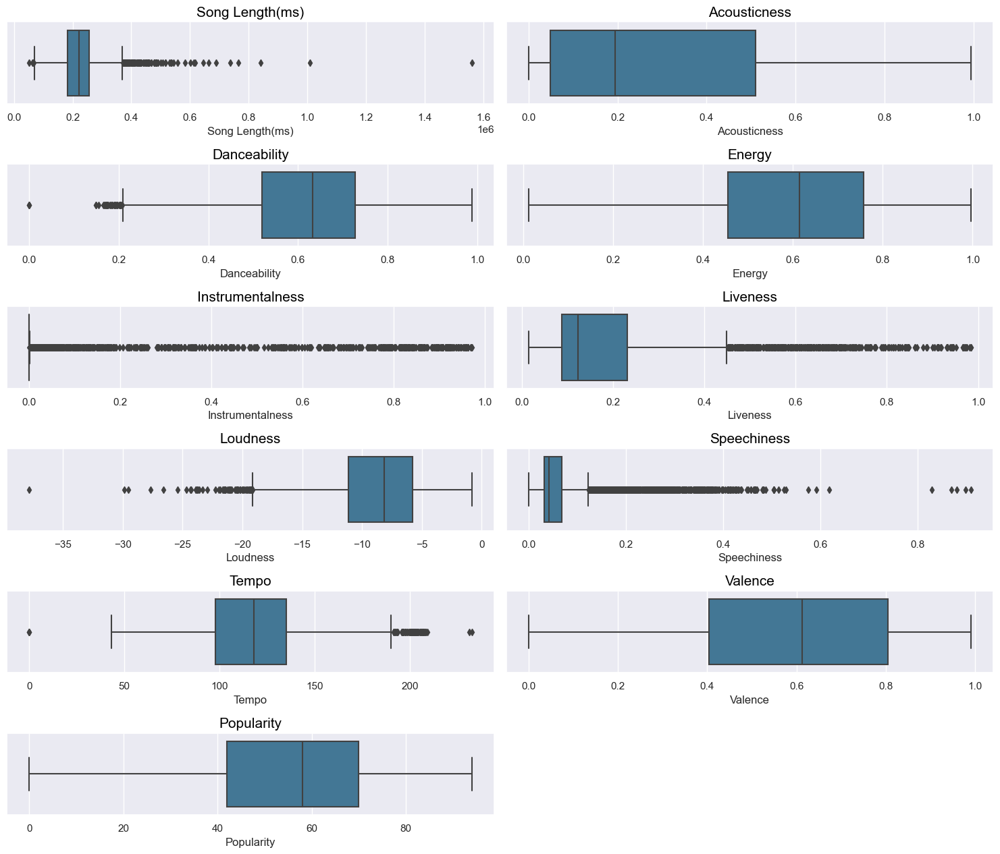

In [40]:
plt.figure(figsize = (15,25))
for idx, i in enumerate(cont):
    plt.subplot(12, 2, idx + 1)
    sns.boxplot(x = i, data = df,palette="mako")
    plt.title(i,color='black',fontsize=15)
    plt.xlabel(i, size = 12)
plt.tight_layout()
plt.show()

There are outliers but we will handle them later.

# **Histplots and Kdeplots**

Check distributions

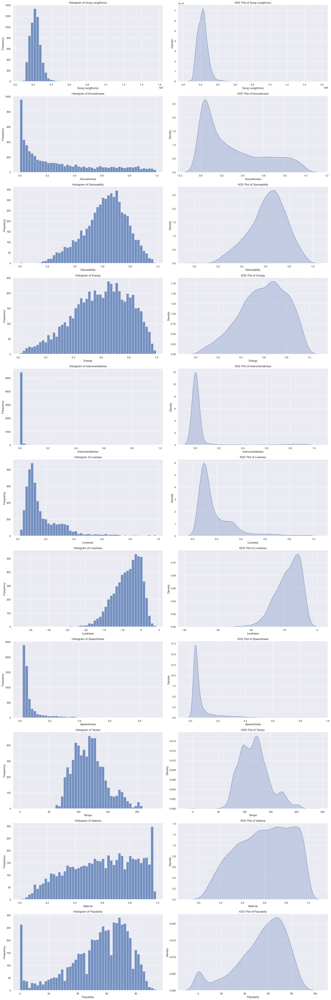

In [41]:
fig, axs = plt.subplots(len(cont.columns), 2, figsize=(20, 60))

axs = axs.flatten()

for i, column in enumerate(cont.columns):

    sns.histplot(cont[column], bins=50, ax=axs[2*i])
    axs[2*i].set_title(f'Histogram of {column}')
    axs[2*i].set_xlabel(column)
    axs[2*i].set_ylabel('Frequency')

    sns.kdeplot(cont[column], ax=axs[2*i+1], fill=True)
    axs[2*i+1].set_title(f'KDE Plot of {column}')
    axs[2*i+1].set_xlabel(column)
    axs[2*i+1].set_ylabel('Density')
plt.tight_layout()
plt.show()

The 'popularity' feature has over 250 zeros. We will further investigate to determine if these zeros represent null values or if they are


In [42]:
def check_distribution(data):
    skewness = stats.skew(data)
    _, shapiro_p_value = stats.shapiro(data)

    if shapiro_p_value > 0.05:
        if skewness > 0:
            return "Right-skewed"
        elif skewness < 0:
            return "Left-skewed"
        else:
            return "Normally distributed"
    else:
        return "Not normally distributed"

results = cont.apply(check_distribution)

print(results)

Song Length(ms)     Not normally distributed
Acousticness        Not normally distributed
Danceability        Not normally distributed
Energy              Not normally distributed
Instrumentalness    Not normally distributed
Liveness            Not normally distributed
Loudness            Not normally distributed
Speechiness         Not normally distributed
Tempo               Not normally distributed
Valence             Not normally distributed
Popularity          Not normally distributed
dtype: object


C:\Users\lenovo\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Some features, like 'danceability', appear to have a distribution close to normal. However, most of the other features seem to be right-skewed.


In [43]:

# rows_to_delete = df[df['Tempo'] > 230].index
# df.drop(rows_to_delete, inplace=True)

# rows_to_delete = df[df['Loudness'] < -35].index
# df.drop(rows_to_delete, inplace=True)

# rows_to_delete = df[df['Speechiness'] > 0.8].index
# df.drop(rows_to_delete, inplace=True)

# df.reset_index(drop=True, inplace=True)


In [44]:
list(cat.columns)

['Song',
 'Album',
 'Album Release Date',
 'Artist Names',
 'Artist(s) Genres',
 'Hot100 Ranking Year',
 'Hot100 Rank',
 'Spotify Link',
 'Song Image',
 'Spotify URI',
 'Key',
 'Mode',
 'Time Signature',
 'Year']

**Countplot**

Most artists have multiple songs in the dataset.


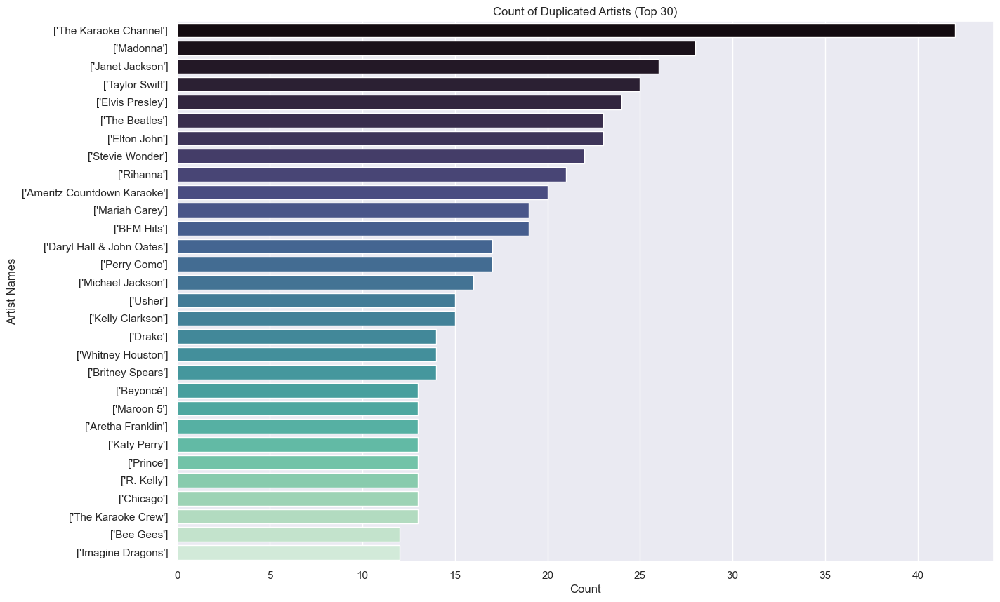

In [45]:
duplicatedArtists=df[df['Artist Names'].duplicated()]
artist_counts = df['Artist Names'].value_counts()
top_30_artists = artist_counts.head(30)
plt.figure(figsize=(15, 10))
sns.countplot(y='Artist Names', data=df[df['Artist Names'].isin(top_30_artists.index)], order=top_30_artists.index,palette='mako')
plt.title('Count of Duplicated Artists (Top 30)')
plt.xlabel('Count')
plt.ylabel('Artist Names')
plt.show()

Average popularity in these top 30 artists.

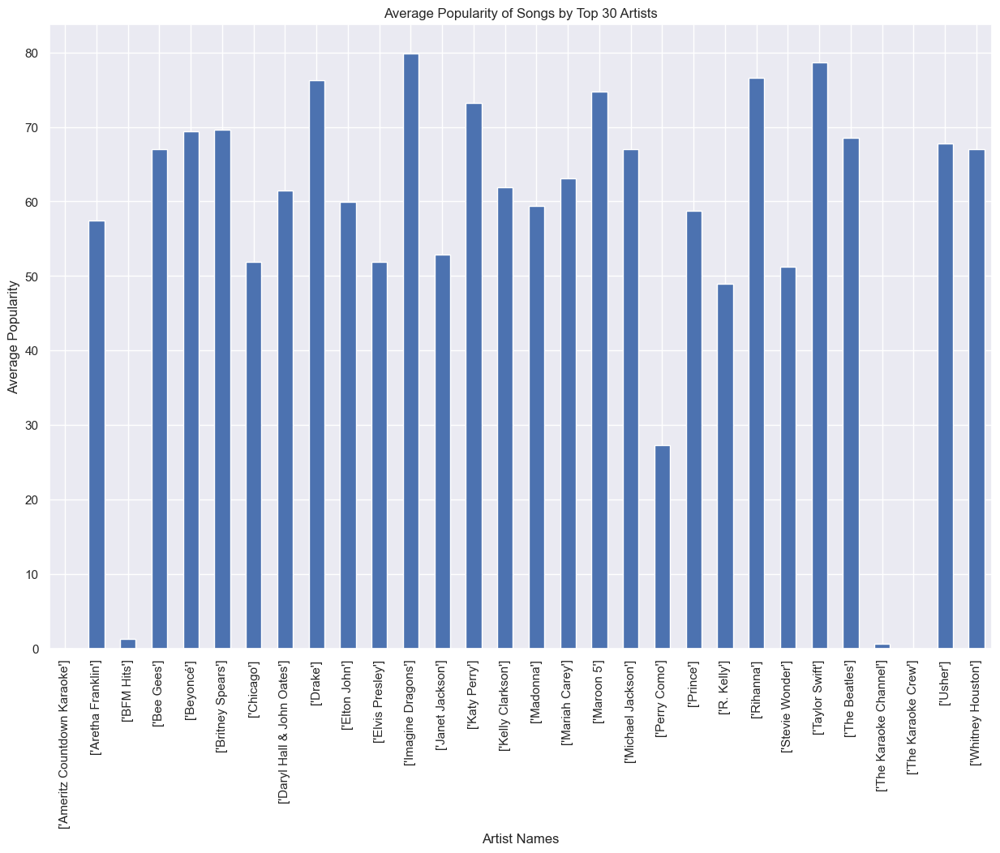

In [46]:
top_30_artists = df['Artist Names'].value_counts().head(30).index

average_popularity = df[df['Artist Names'].isin(top_30_artists)].groupby('Artist Names')['Popularity'].mean()

plt.figure(figsize=(15, 10))
average_popularity.plot(kind='bar')
plt.title('Average Popularity of Songs by Top 30 Artists')
plt.xlabel('Artist Names')
plt.ylabel('Average Popularity')
plt.xticks(rotation=90)
plt.show()

In [47]:
df[df['Artist Names']=="['Ameritz Countdown Karaoke']"]

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Year
95,Baby Come to Me (In the Style of Patti Austin and James Ingram) [Karaoke Version],"Karaoke Hits from 1983, Vol. 2",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1983,8,211271,https://open.spotify.com/track/6cFSWxcBkW0YL8bxuJS3wD,https://i.scdn.co/image/ab67616d00001e023d60fac9845a4abf3c0323bc,spotify:track:6cFSWxcBkW0YL8bxuJS3wD,0,0.597000,0.567,0.370,0.251000,0.2560,-15.497,0.0266,92.035,0.3250,5,0,4,2013
743,Don't Be Cruel (In the Style of Cheap Trick) [Karaoke Version],"Karaoke Hits from 1988, Vol. 4",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1988,70,184845,https://open.spotify.com/track/6ivjZlHWVjWwMFchFSUMX3,https://i.scdn.co/image/ab67616d00001e021a6e522c90dadf2aea275f90,spotify:track:6ivjZlHWVjWwMFchFSUMX3,0,0.004280,0.618,0.466,0.860000,0.1020,-11.549,0.0494,169.774,0.7140,9,1,4,2013
1084,I'm Gonna Get Married (In the Style of Lloyd Price) [Karaoke Version],"Karaoke Hits from 1959, Vol. 2",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1959,23,145000,https://open.spotify.com/track/71P5lkXOvji6nscHQxlGg5,https://i.scdn.co/image/ab67616d00001e026d75f71ab4b42aa23db51e03,spotify:track:71P5lkXOvji6nscHQxlGg5,0,0.385000,0.615,0.570,0.000004,0.6850,-10.075,0.0292,121.089,0.7030,7,1,4,2013
1296,Up Jumps da Boogie (In the Style of Magoo & Timbaland) [Karaoke Version],"Karaoke Hits from 1997, Vol. 26",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1997,58,290000,https://open.spotify.com/track/5j9JvxTF5y5CG6Z00NhY77,https://i.scdn.co/image/ab67616d00001e0299ec1f45a23f681006469bdf,spotify:track:5j9JvxTF5y5CG6Z00NhY77,0,0.015400,0.749,0.552,0.007080,0.5900,-12.195,0.1950,75.044,0.7250,1,0,4,2013
1584,You Don't Bring Me Flowers (In the Style of Neil Diamond and Barbra Streisand) [Karaoke Version],"Karaoke Hits from 1979, Vol. 21",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1979,21,186841,https://open.spotify.com/track/4ADRt1ZDWPbZIEOQowqHtH,https://i.scdn.co/image/ab67616d00001e02ac60659ffd7f22f4c6595dea,spotify:track:4ADRt1ZDWPbZIEOQowqHtH,0,0.631000,0.240,0.103,0.758000,0.0834,-16.129,0.0381,129.607,0.1010,0,1,4,2013
2035,Don't Wanna Be a Player (In the Style of Joe) [Karaoke Version],"Karaoke Hits from 1997, Vol. 6",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1997,84,303000,https://open.spotify.com/track/1O7Ay5rJFDPrb5bMVZ5EJa,https://i.scdn.co/image/ab67616d00001e02d99a8075bb2e03d7dd78cc4b,spotify:track:1O7Ay5rJFDPrb5bMVZ5EJa,0,0.265000,0.772,0.358,0.000034,0.0803,-12.046,0.0982,81.019,0.8500,8,0,4,2013
2136,Don't Shed a Tear (In the Style of Paul Carrack) [Karaoke Version],"Karaoke Hits from 1988, Vol. 4",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1988,83,223953,https://open.spotify.com/track/3sDszkn8lBiVc16tpdryJ4,https://i.scdn.co/image/ab67616d00001e021a6e522c90dadf2aea275f90,spotify:track:3sDszkn8lBiVc16tpdryJ4,0,0.344000,0.720,0.526,0.448000,0.0820,-12.178,0.0341,108.771,0.7250,11,0,4,2013
2522,I'll Always Love You (In the Style of Taylor Dayne) [Karaoke Version],"Karaoke Hits from 1988, Vol. 9",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1988,20,278945,https://open.spotify.com/track/1TkoJnobNwboFnuUMpbASd,https://i.scdn.co/image/ab67616d00001e022b9384bfa4f53955b8fe107b,spotify:track:1TkoJnobNwboFnuUMpbASd,0,0.683000,0.692,0.372,0.401000,0.1460,-14.039,0.0274,85.249,0.4010,0,1,4,2013
2671,The Best Things in Life Are Free (In the Style of Luther Vandross and Janet Jackson) [Mo'money] [Karaoke Version],"Karaoke Hits from 1992, Vol. 8",5/16/2013,['Ameritz Countdown Karaoke'],['karaoke'],1992,41,278000,https://open.spotify.com/track/0SKrMUVxHcr9sImVv0somj,https://i.scdn.co/image/ab67616d00001e0265206f1836212685b454dcdc,spotify:track:0SKrMUVxHcr9sImVv0somj,0,0.000071,0.792,0.562,0.791000,0.096

The artists with the most popular songs are typically the most successful and famous in the industry.


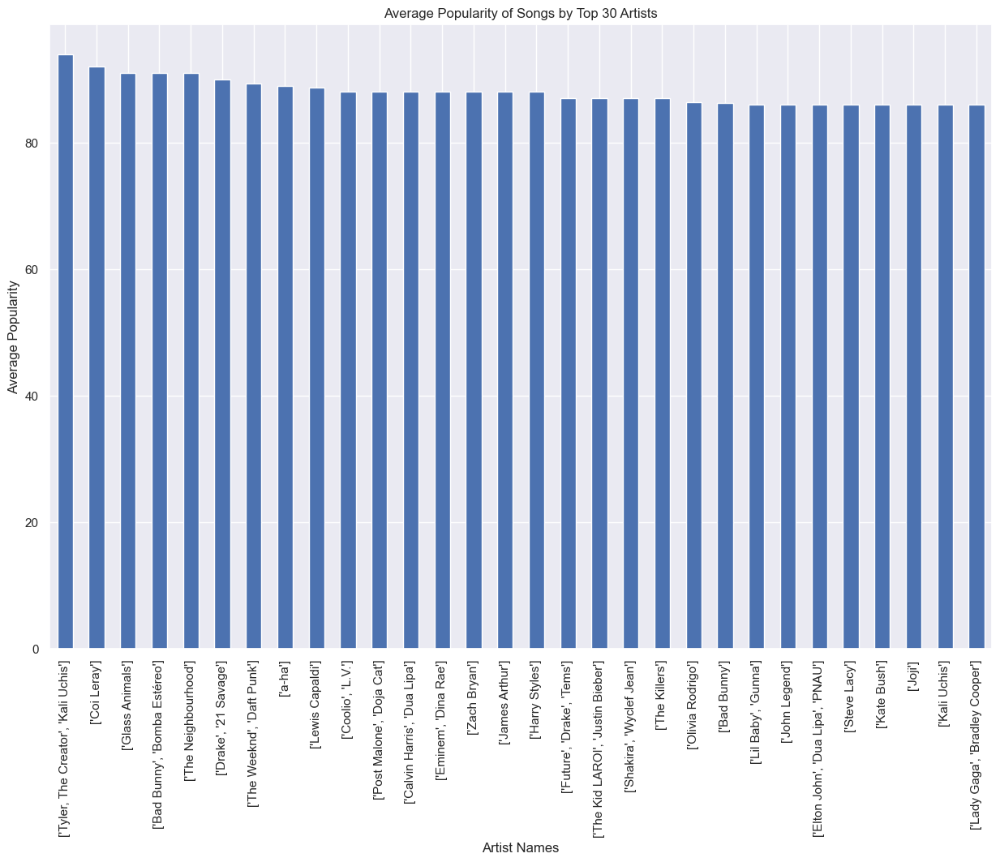

In [48]:
average_popularity = df.groupby('Artist Names')['Popularity'].mean()

top_30_artists = average_popularity.sort_values(ascending=False).head(30)


plt.figure(figsize=(15, 10))
top_30_artists.plot(kind='bar')
plt.title('Average Popularity of Songs by Top 30 Artists')
plt.xlabel('Artist Names')
plt.ylabel('Average Popularity')
plt.xticks(rotation=90)
plt.show()

The albums with the most popular songs.


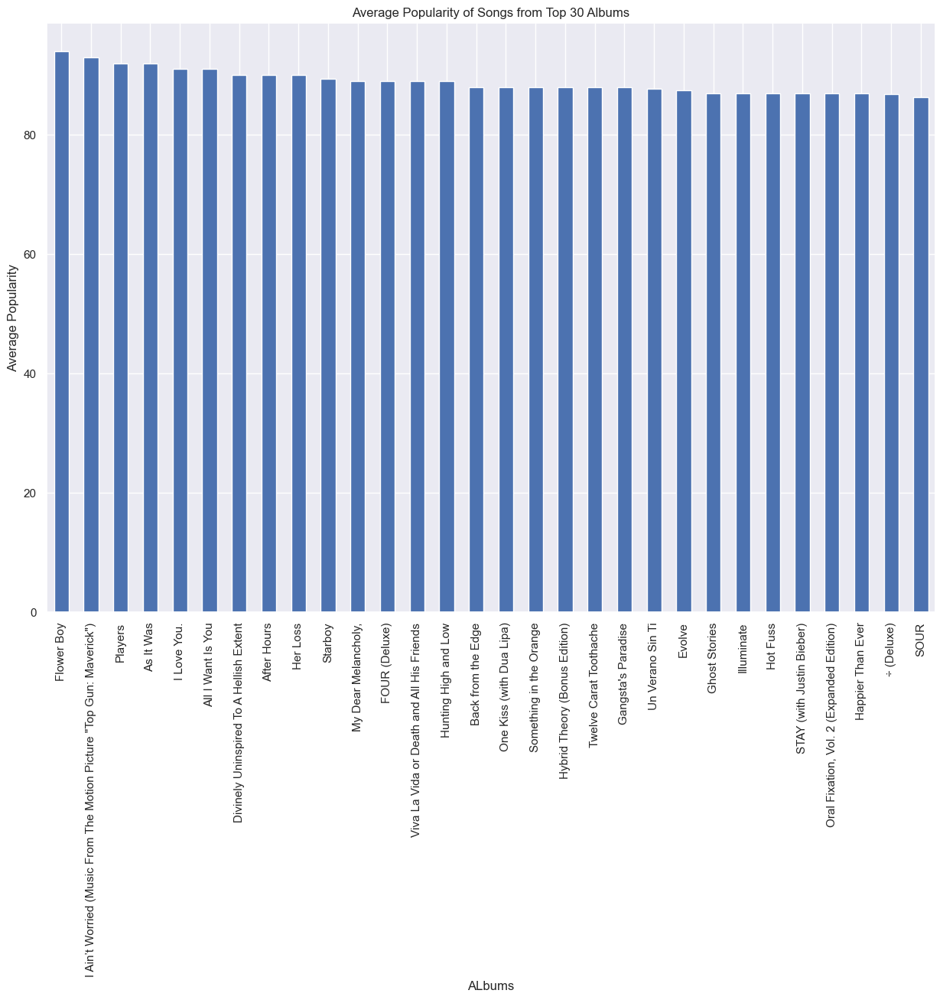

In [49]:
average_popularity = df.groupby('Album')['Popularity'].mean()


top_30_albums = average_popularity.sort_values(ascending=False).head(30)


plt.figure(figsize=(15, 10))
top_30_albums.plot(kind='bar')
plt.title('Average Popularity of Songs from Top 30 Albums')
plt.xlabel('ALbums')
plt.ylabel('Average Popularity')
plt.xticks(rotation=90)
plt.show()

In [50]:
pd.set_option('display.max_colwidth', None)
df[df['Popularity']==0]

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Year
4,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,8/16/2011,['The Karaoke Crew'],['karaoke'],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,0.01490,0.843,0.348,0.00128,0.2470,-10.669,0.0545,143.595,0.385,7,0,4,2011
32,lately - Demo,lately (Demo),12/7/2022,['Divine Simisi'],['karaoke'],1999,31,212509,https://open.spotify.com/track/0cv9WHEizHUkZAo0kXorgA,https://i.scdn.co/image/ab67616d00001e025bfba4555394d8ba353d7945,spotify:track:0cv9WHEizHUkZAo0kXorgA,0,0.94500,0.727,0.137,0.00000,0.3810,-14.116,0.1770,85.299,0.205,0,1,3,2022
47,Ain't Gonna Bump No More (With No Big Fat Woman) (Karaoke in the style of Joe Tex),1977 Karaoke Classics Volume 1,9/21/2009,['1970s Karaoke Band'],['karaoke'],1977,86,207960,https://open.spotify.com/track/0iuiShbEoKD6JSvtDuai5m,https://i.scdn.co/image/ab67616d00001e02c6a1082b86ac193286d4717d,spotify:track:0iuiShbEoKD6JSvtDuai5m,0,0.00311,0.770,0.496,0.36100,0.3270,-15.056,0.0539,113.099,0.880,2,1,4,2009
78,Sober,This Has To Work part 1,5/14/2023,['Pink Tummies'],['karaoke'],2009,38,218742,https://open.spotify.com/track/09b54T8p2U6I2yqIOrpkKH,https://i.scdn.co/image/ab67616d00001e026b9afc67906c95a941b910ea,spotify:track:09b54T8p2U6I2yqIOrpkKH,0,0.00136,0.453,0.798,0.01360,0.2500,-10.522,0.0653,175.119,0.536,0,1,4,2023
79,Bad Things (Originally Performed by Machine Gun Kelly & Camila Cabello) - Karaoke Version,"Karaoke Chart Hits 2017, Vol. 1",5/24/2017,['Covered Up'],['karaoke'],2017,41,240274,https://open.spotify.com/track/36G7bhoybM2hz6A5KTLfqb,https://i.scdn.co/image/ab67616d00001e02e773efddec598833747cdbb5,spotify:track:36G7bhoybM2hz6A5KTLfqb,0,0.23400,0.771,0.522,0.79500,0.1380,-10.004,0.0346,138.012,0.175,2,1,4,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6091,My Humps - Originally Performed By Black Eyed Peas,40 Super Hits Karaoke: Ultimate Hits V2,12/11/2011,['B the Star'],['karaoke'],2006,42,309865,https://open.spotify.com/track/0T6lVd2JSk7R803PfCXFJS,https://i.scdn.co/image/ab67616d00001e0298c8e373e03823b973ae901a,spotify:track:0T6lVd2JSk7R803PfCXFJS,0,0.00100,0.855,0.487,0.82500,0.1760,-13.717,0.0998,124.040,0.379,1,1,4,2011
6092,Cupid / I've Loved You For a Long Time,1980,4/24/2017,['The Spinners'],"['soul', 'funk', 'motown', 'philly soul', 'classic soul', 'quiet storm', 'disco']",1980,29,236693,https://open.spotify.com/track/7uM6hZucDj4zQKydInp8Gl,https://i.scdn.co/image/ab67616d00001e02445a104ded721073a220d8f0,spotify:track:7uM6hZucDj4zQKydInp8Gl,0,0.35500,0.783,0.669,0.00000,0.0826,-9.438,0.0430,122.772,0.871,9,1,4,2017
6100,"Slide - Electro Piano Cover Calvin Harris , Frank Ocean & Migos",The Futur Is Only Female - EP (Continental Charts 2017),3/16/2017,['Sharleen Ka'],['karaoke'],2017,71,169000,https://open.spotify.com/track/2L1iMs5AR4PbWIEl32rx1c,https://i.scdn.co/image/ab67616d00001e02a2d43828c471fe8d5220a9a5,spotify:track:2L1iMs5AR4PbWIEl32rx1c,0,0.15400,0.673,0.533,0.02770,0.1430,-6.341,0.0730,103.068,0.326,8,1,4,2017
6108,She'd Rather Be with Me (Originally Performed by The Turtles) [Karaoke Version],"The Karaoke Channel - Pop Hits of 1967, Vol. 3",9/22/2016,['The Karaoke Channel'],['karaoke'],1967,78,139784,https://open.spotify.com/track/3Yh9arZbumAYc5xGqdeas4,https://i.scdn.co/image/ab67616d00001e0288a2b86b404db278f0b76b06,spotify:track:3Yh9arZbumAYc5xGqdeas4,0,0.20200,0.600,0.610,0.00327,0.3430,-11.293,0.0291,125.131,0.902,7,1,4,2016


Most repeated years in the dataset

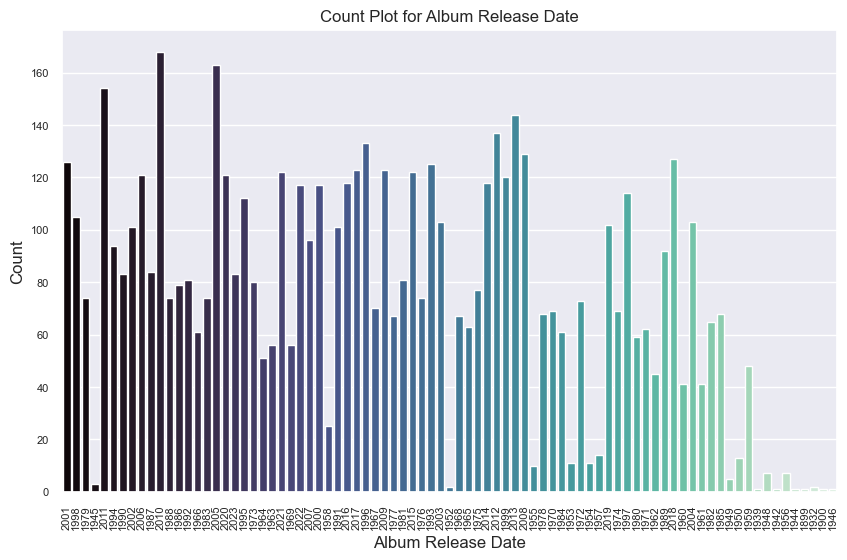

In [51]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Year', palette='mako')
plt.title('Count Plot for Album Release Date')
plt.xlabel('Album Release Date')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

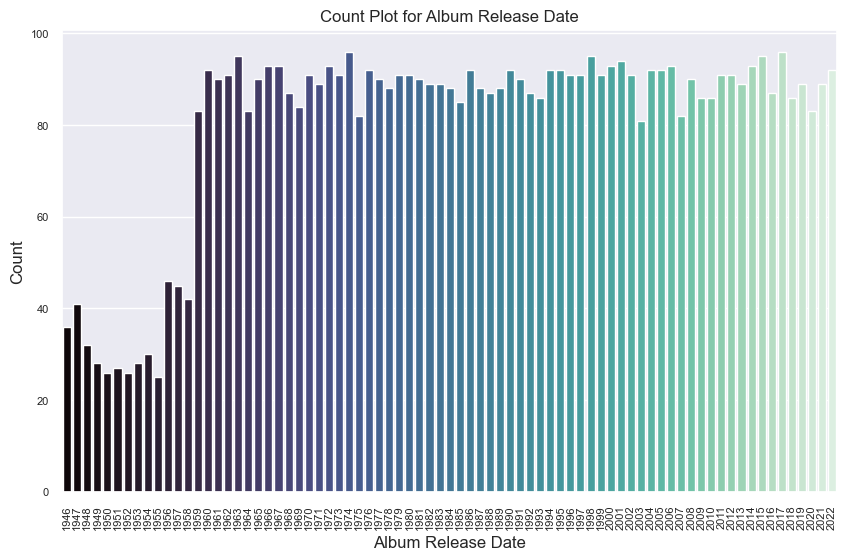

In [52]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Hot100 Ranking Year', palette='mako')
plt.title('Count Plot for Album Release Date')
plt.xlabel('Album Release Date')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

In [53]:
df['Year'] = df['Year'].astype(int)

Albums with most columns

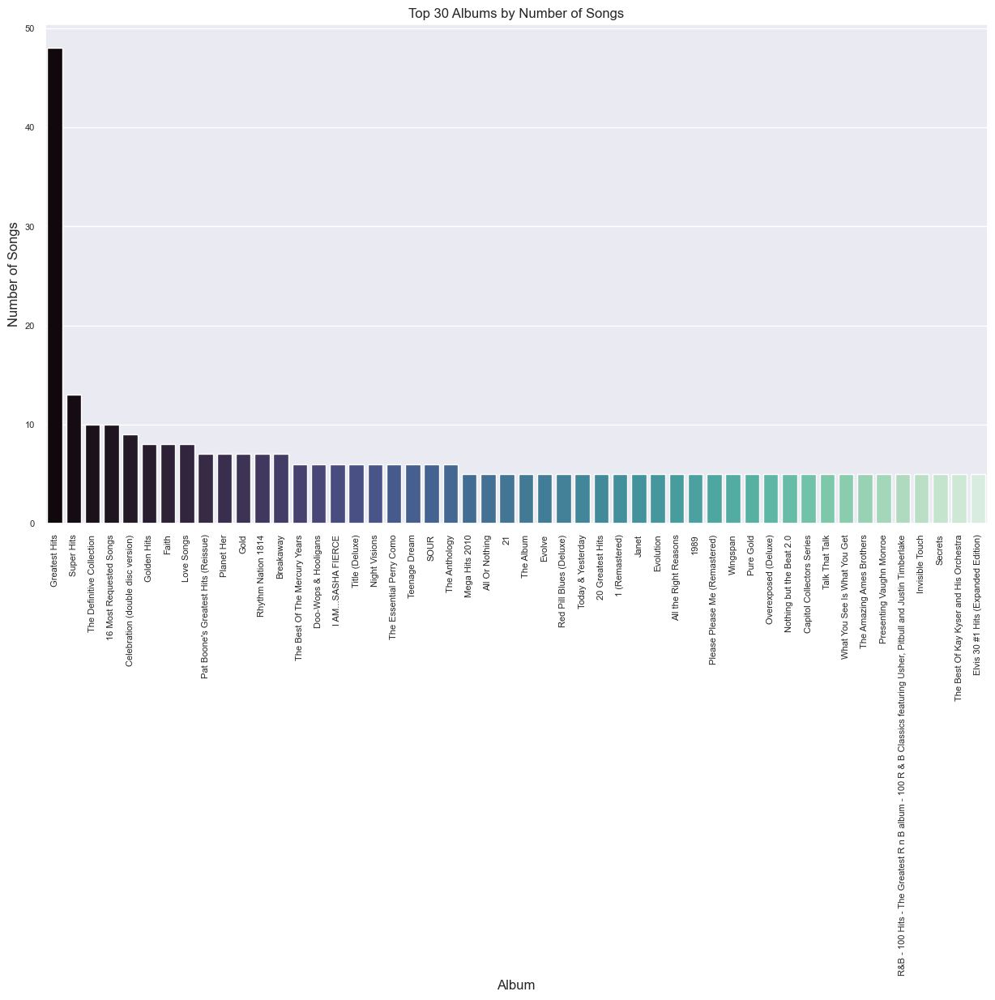

In [54]:
album_counts = df['Album'].value_counts().reset_index()
album_counts.columns = ['Album', 'Count']
top_30_albums = album_counts.head(50)


plt.figure(figsize=(15, 8))
sns.barplot(data=top_30_albums, x='Album', y='Count', palette='mako')
plt.title('Top 30 Albums by Number of Songs')
plt.xlabel('Album')
plt.ylabel('Number of Songs')
plt.xticks(rotation=90)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

**Scatterplots**

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14076\923165005.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, y='Year', x='Popularity', palette='mako')


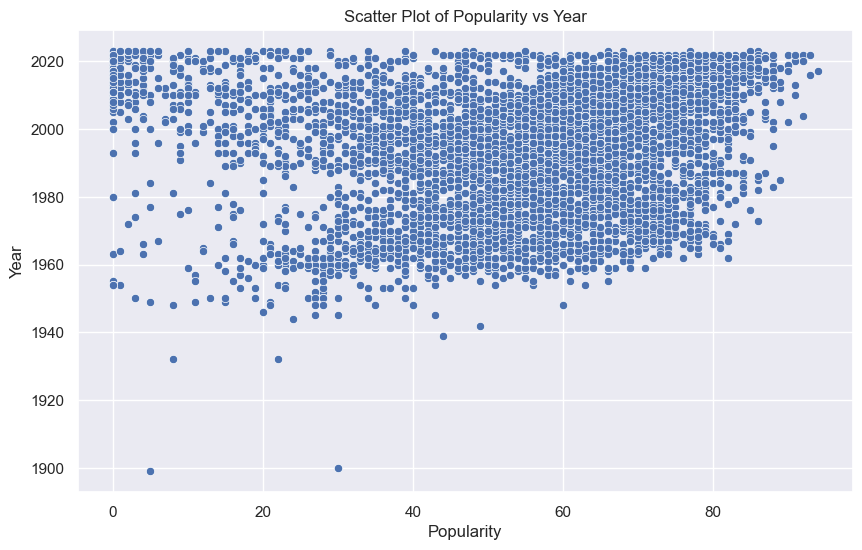

In [55]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Year', x='Popularity', palette='mako')
plt.title('Scatter Plot of Popularity vs Year')
plt.ylabel('Year')
plt.xlabel('Popularity')
plt.grid(True)
plt.show()

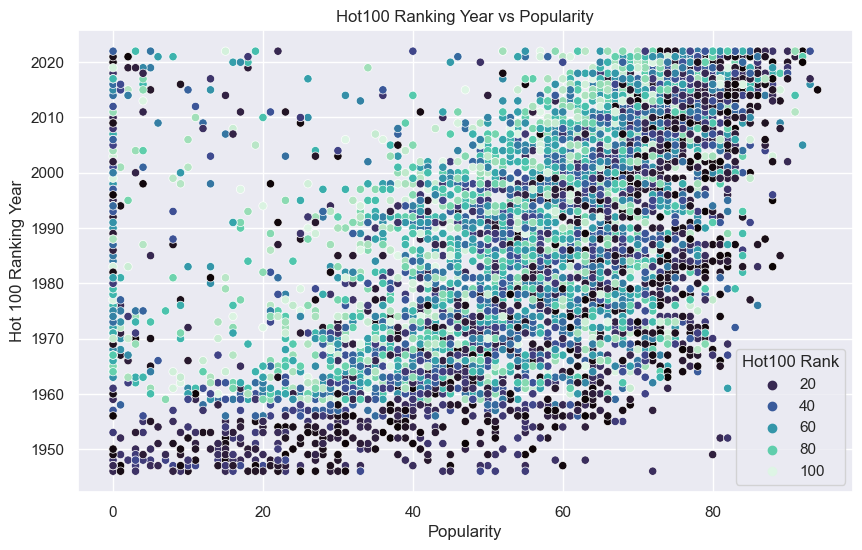

In [56]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Hot100 Ranking Year', hue='Hot100 Rank',x='Popularity', palette='mako')
plt.title('Hot100 Ranking Year vs Popularity')
plt.xlabel('Popularity')
plt.ylabel('Hot 100 Ranking Year')
plt.grid(True)
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14076\2058157918.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, y='Valence',x='Popularity', palette='mako')


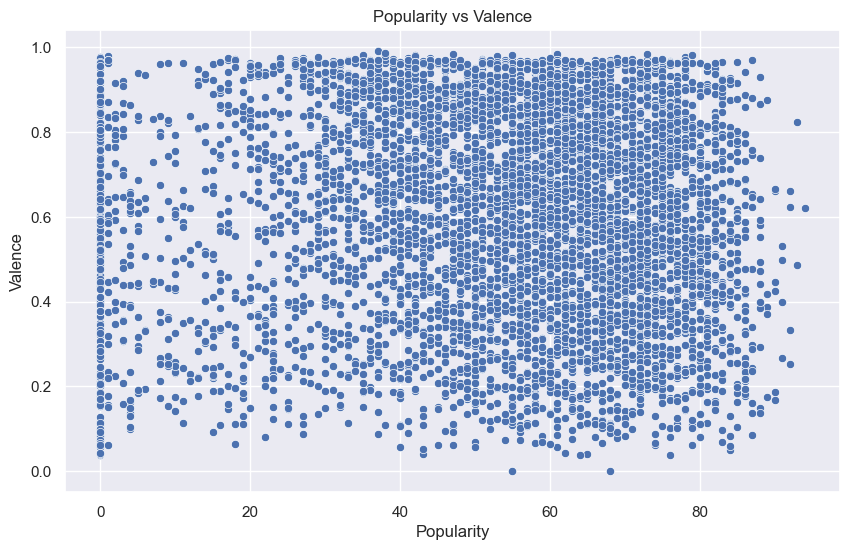

In [57]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Valence',x='Popularity', palette='mako')
plt.title('Popularity vs Valence')
plt.xlabel('Popularity')
plt.ylabel('Valence')
plt.grid(True)
plt.show()

no direct relation betweeen valence and popularity

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14076\3787791955.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, y='Danceability',x='Popularity', palette='mako')


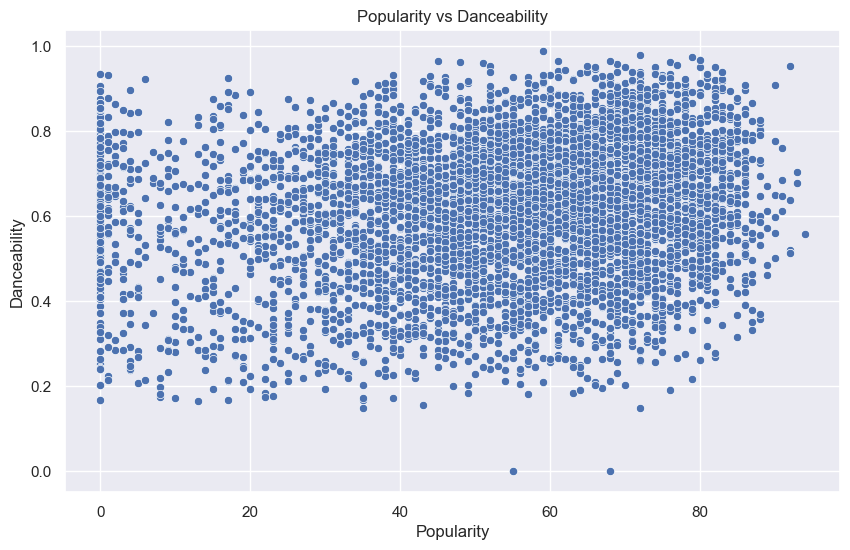

In [58]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Danceability',x='Popularity', palette='mako')
plt.title('Popularity vs Danceability')
plt.xlabel('Popularity')
plt.ylabel('Danceability')
plt.grid(True)
plt.show()

no direct relation betweeen valence and popularity

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14076\3465167453.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, y='Tempo',x='Popularity', palette='mako')


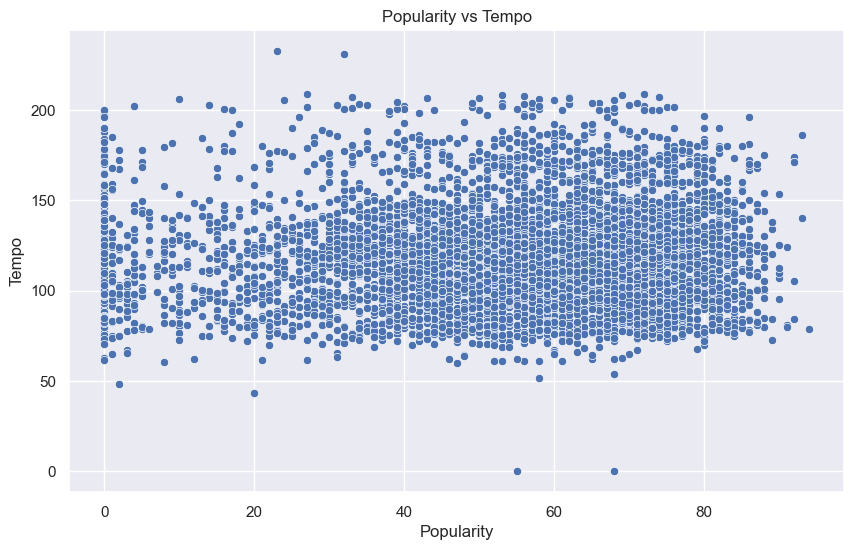

In [59]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Tempo',x='Popularity', palette='mako')
plt.title('Popularity vs Tempo')
plt.xlabel('Popularity')
plt.ylabel('Tempo')
plt.grid(True)
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14076\1491716081.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, y='Loudness',x='Popularity', palette='mako')


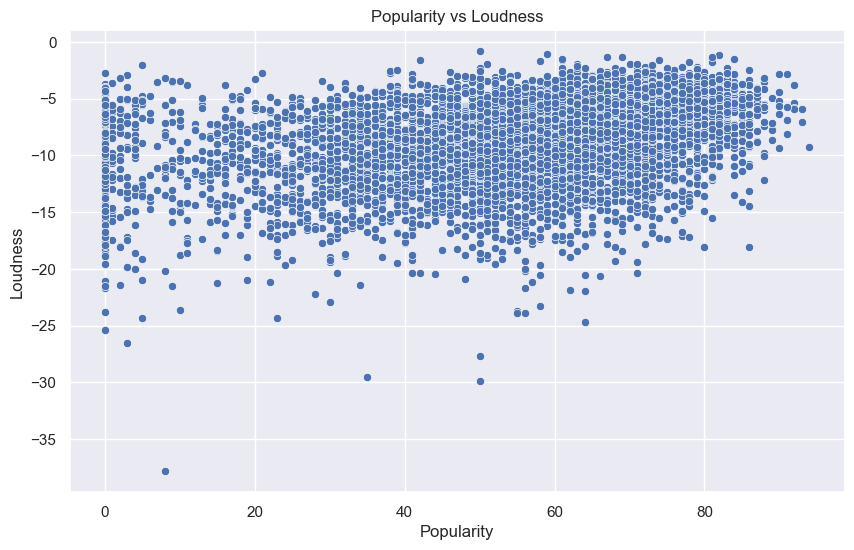

In [60]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Loudness',x='Popularity', palette='mako')
plt.title('Popularity vs Loudness')
plt.xlabel('Popularity')
plt.ylabel('Loudness')
plt.grid(True)
plt.show()

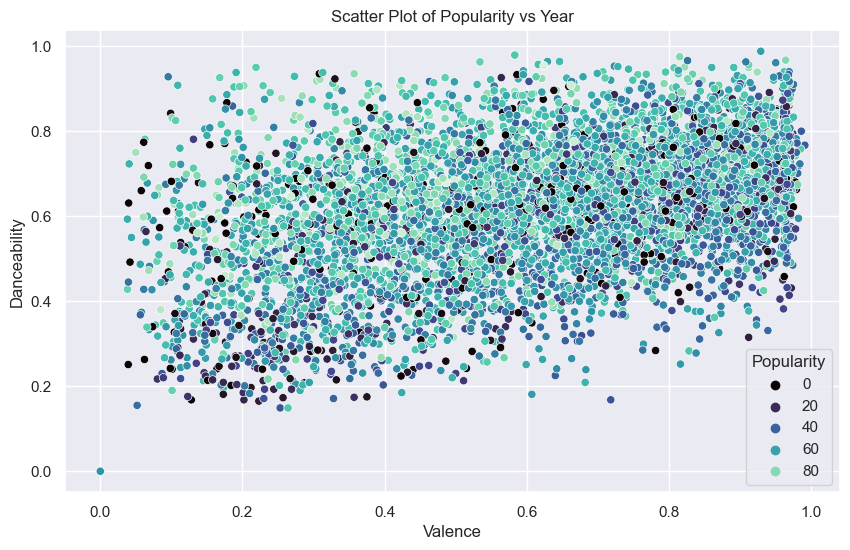

In [61]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Danceability',x='Valence',hue='Popularity', palette='mako')
plt.title('Scatter Plot of Popularity vs Year')
plt.xlabel('Valence')
plt.ylabel('Danceability')
plt.grid(True)
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14076\3787791955.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, y='Danceability',x='Popularity', palette='mako')


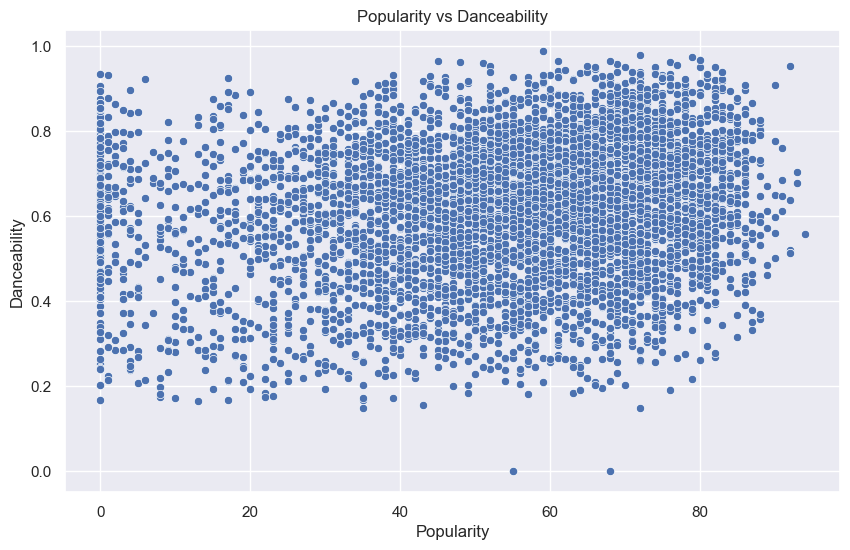

In [62]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Danceability',x='Popularity', palette='mako')
plt.title('Popularity vs Danceability')
plt.xlabel('Popularity')
plt.ylabel('Danceability')
plt.grid(True)
plt.show()

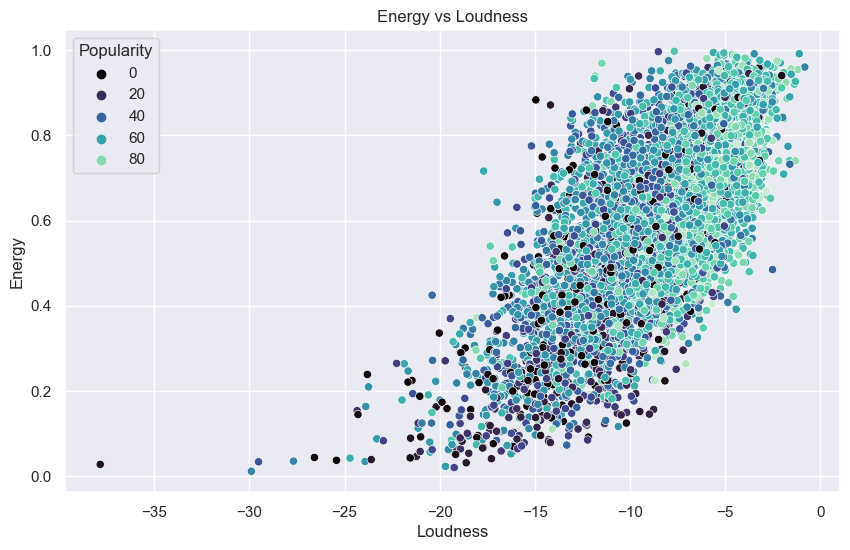

In [63]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Energy',x='Loudness',hue='Popularity', palette='mako')
plt.title('Energy vs Loudness')
plt.xlabel('Loudness')
plt.ylabel('Energy')
plt.grid(True)
plt.show()

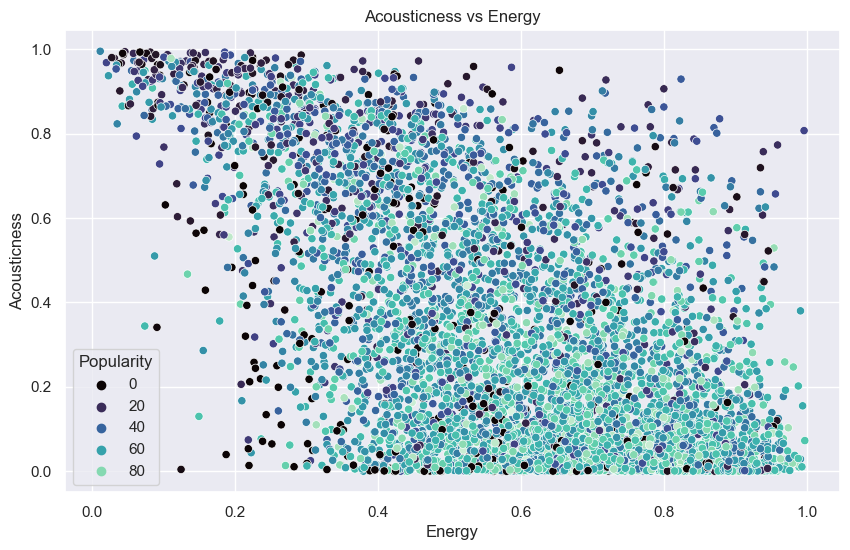

In [64]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='Acousticness',x='Energy',hue='Popularity', palette='mako')
plt.title('Acousticness vs Energy')
plt.xlabel('Energy')
plt.ylabel('Acousticness')
plt.grid(True)
plt.show()

In [65]:
df['minutes_length'] = df['Song Length(ms)'].apply(lambda x: x / 60000)
df.head()

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Year,minutes_length
0,I Need You,I Need You,1/30/2001,['LeAnn Rimes'],"['country dawn', 'contemporary country', 'country road', 'country']",2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,62,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,2001,3.830433
1,Sweet Lady,Tyrese,8/31/1998,['Tyrese'],"['hip pop', 'contemporary r&b', 'urban contemporary', 'r&b']",1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,63,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4,1998,4.843333
2,You Take My Breath Away - Mono Version,Sooner or Later,1979,['Rex Smith'],['bubblegum pop'],1979,86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6DqB9N8D,https://i.scdn.co/image/ab67616d00001e02d1741c9f06876cb631c9646e,spotify:track:3BCMsz55asr7Yr6DqB9N8D,49,0.4760,0.313,0.600,0.000026,0.523,-7.913,0.0357,141.912,0.272,11,1,4,1979,3.290883
3,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),1945,"['Doris Day', 'The Mellomen']","['adult standards', 'easy listening', 'movie tunes', 'vocal jazz', 'lounge']",1954,20,169066,https://open.spotify.com/track/20G1XJaTwIm2IuwA3Pjg1d,https://i.scdn.co/image/ab67616d00001e02f2ee02ef38c965d5ebe540fa,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,43,0.9730,0.503,0.059,0.000000,0.103,-16.131,0.0497,76.642,0.331,9,1,4,1945,2.817767
4,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,8/16/2011,['The Karaoke Crew'],['karaoke'],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,0.0149,0.843,0.348,0.001280,0.247,-10.669,0.0545,143.595,0.385,7,0,4,2011,4.183550


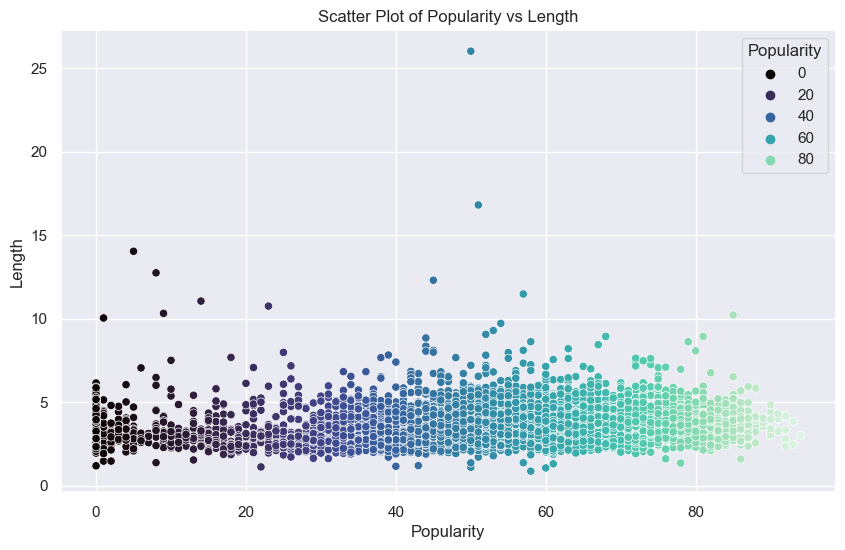

In [66]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, y='minutes_length', x='Popularity',hue='Popularity', palette='mako')
plt.title('Scatter Plot of Popularity vs Length')
plt.ylabel('Length')
plt.xlabel('Popularity')
plt.grid(True)
plt.show()

**Pie Charts**

In [67]:
original_speechiness_values = df['Speechiness'].copy()

In [68]:
def type_of_Song(x):
    if x >= 0.0 and x < 0.1:
        return "very low"
    elif x >= 0.1 and x < 0.3:
        return "low"
    elif x >= 0.3 and x < 0.5:
        return "medium"
    elif x >= 0.5 and x < 0.7:
        return "high"
    else:
        return "very high"

In [69]:
df['Speechiness'] = df['Speechiness'].apply(type_of_Song)

In [70]:
n_songs_per_category = df.groupby('Speechiness').size()
fig=px.pie(df,names=n_songs_per_category.index ,values=n_songs_per_category.values)
fig.update_layout(title='type of songs')
fig.show()

In [71]:
df['Speechiness']=original_speechiness_values

In [72]:
Tempo_original_value=df['Tempo'].copy()

In [73]:
def classify_tempo(bpm):
    if bpm < 90:
        return "Slow"
    elif 90 <= bpm <= 130:
        return "Moderate"
    else:
        return "Fast"

In [74]:
df['Tempo'] = df['Tempo'].apply(classify_tempo)

In [75]:
n_songs_per_category = df.groupby('Tempo').size()

fig = px.pie(names=n_songs_per_category.index,
             values=n_songs_per_category.values,
             title='Types of Tempo')

fig.update_layout(title='Types of Tempo')
fig.show()

In [76]:
df['Tempo']=Tempo_original_value

In [77]:
valence_original_value=df['Valence'].copy()

In [78]:
def valence_type(x):
    if x >= 0.0 and x < 0.5:
        return "Happy|Positive"
    elif x >= 0.5 and x < 1:
        return "Sad|Negative"
df['Valence']=df['Valence'].apply(valence_type)

In [79]:
n_songs_per_category = df.groupby('Valence').size()
fig=px.pie(df,names=n_songs_per_category.index ,values=n_songs_per_category.values)
fig.update_layout(title='types of valence (Happy or sad)')

fig.show()

In [80]:
df['Valence']=valence_original_value

**How songs popularity increases over time**

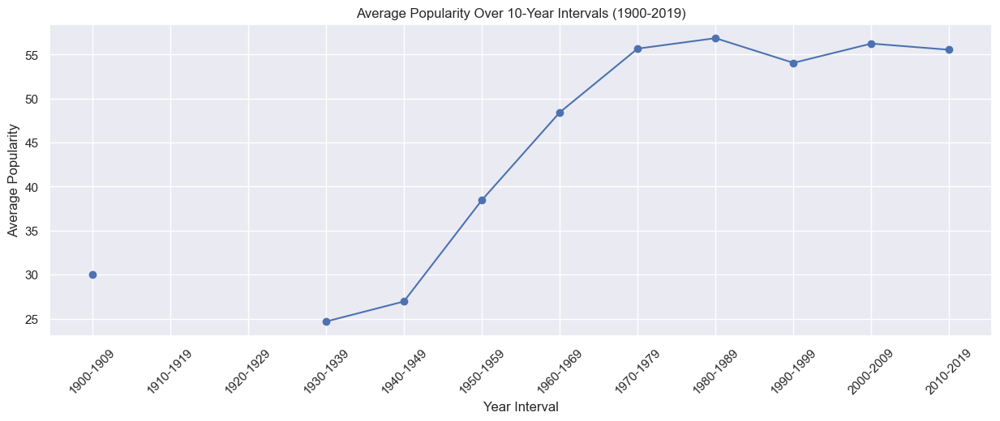

In [81]:
df_sorted = df.sort_values(by='Year')

bins = range(1900, 2030, 10)
labels = [f"{i}-{i+9}" for i in range(1900, 2020, 10)]

df_sorted['Year Group'] = pd.cut(df_sorted['Year'], bins=bins, labels=labels, right=False)

avg_popularity_by_year = df_sorted.groupby('Year Group')['Popularity'].mean()

plt.figure(figsize=(15, 5))
plt.plot(avg_popularity_by_year.index, avg_popularity_by_year.values, marker='o', linestyle='-')
plt.title('Average Popularity Over 10-Year Intervals (1900-2019)')
plt.xlabel('Year Interval')
plt.ylabel('Average Popularity')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Higher popularities tend to be in more recent years. As we look further back in time, the popularities of songs generally decrease.


## Insights from EDA Visualizations

**Hot Ranking Year & Popularity**: There is a direct proportional relationship between the hot ranking year and popularity rank.
  
  
**Valence & Popularity**: There is no direct relationship between valence and popularity, loudness, or tempo.


**Valence & Danceability**: Valence and danceability are somewhat directly proportional. Songs with higher danceability tend to have higher popularity.


**Energy, Loudness & Popularity**: Energy and loudness are directly proportional to each other. Higher loudness and energy levels correlate with higher popularity.


**Acousticness & Energy**: Acousticness and energy show an inverse relationship. Popularity tends to be higher with lower acousticness.


**Song Length & Popularity**: There is no direct proportional relationship between song length and popularity. However, songs with extremely long lengths do not have high popularity.


**Speechiness**: Most of the dataset has very low speechiness.


**Tempo & Speed**: Over 54% of the data indicates songs that are neither too fast nor too slow. Fast songs with high tempo are twice as common as slow songs.


**Mood & Popularity**: More than 64% of the dataset comprises sad songs. Interestingly, sad songs seem to have higher popularity.


# **Feature Engineering**

In [82]:
df.head()

,Song,Album,Album Release Date,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Year,minutes_length
0,I Need You,I Need You,1/30/2001,['LeAnn Rimes'],"['country dawn', 'contemporary country', 'country road', 'country']",2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,62,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,2001,3.830433
1,Sweet Lady,Tyrese,8/31/1998,['Tyrese'],"['hip pop', 'contemporary r&b', 'urban contemporary', 'r&b']",1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,63,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4,1998,4.843333
2,You Take My Breath Away - Mono Version,Sooner or Later,1979,['Rex Smith'],['bubblegum pop'],1979,86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6DqB9N8D,https://i.scdn.co/image/ab67616d00001e02d1741c9f06876cb631c9646e,spotify:track:3BCMsz55asr7Yr6DqB9N8D,49,0.4760,0.313,0.600,0.000026,0.523,-7.913,0.0357,141.912,0.272,11,1,4,1979,3.290883
3,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),1945,"['Doris Day', 'The Mellomen']","['adult standards', 'easy listening', 'movie tunes', 'vocal jazz', 'lounge']",1954,20,169066,https://open.spotify.com/track/20G1XJaTwIm2IuwA3Pjg1d,https://i.scdn.co/image/ab67616d00001e02f2ee02ef38c965d5ebe540fa,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,43,0.9730,0.503,0.059,0.000000,0.103,-16.131,0.0497,76.642,0.331,9,1,4,1945,2.817767
4,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,8/16/2011,['The Karaoke Crew'],['karaoke'],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0,0.0149,0.843,0.348,0.001280,0.247,-10.669,0.0545,143.595,0.385,7,0,4,2011,4.183550


In [83]:
df.drop(['Album Release Date', 'minutes_length'], axis=1, inplace=True)

df.reset_index(drop=True, inplace=True)


In [84]:
df=df[['Song', 'Album','Year','Artist Names', 'Artist(s) Genres',
       'Hot100 Ranking Year', 'Hot100 Rank', 'Song Length(ms)', 'Spotify Link',
       'Song Image', 'Spotify URI', 'Acousticness',
       'Danceability', 'Energy', 'Instrumentalness', 'Liveness', 'Loudness',
       'Speechiness', 'Tempo', 'Valence', 'Key', 'Mode', 'Time Signature','Popularity']]

## Encoding

### **Since the 'artist name' and 'artist genres' columns contain lists of strings, I will split each list into multiple rows, with each element in its own row. I will perform this transformation for both the 'artist name' and 'genre' columns.**

In [85]:
df['Artist Names'] = df['Artist Names'].apply(ast.literal_eval)
df['Artist(s) Genres'] = df['Artist(s) Genres'].apply(ast.literal_eval)


df_exploded = df.explode('Artist Names')
df_exploded = df_exploded.explode('Artist(s) Genres')

df_exploded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33898 entries, 0 to 6170
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Song                 33898 non-null  object 
 1   Album                33898 non-null  object 
 2   Year                 33898 non-null  int32  
 3   Artist Names         33898 non-null  object 
 4   Artist(s) Genres     33898 non-null  object 
 5   Hot100 Ranking Year  33898 non-null  int64  
 6   Hot100 Rank          33898 non-null  int64  
 7   Song Length(ms)      33898 non-null  int64  
 8   Spotify Link         33898 non-null  object 
 9   Song Image           33898 non-null  object 
 10  Spotify URI          33898 non-null  object 
 11  Acousticness         33898 non-null  float64
 12  Danceability         33898 non-null  float64
 13  Energy               33898 non-null  float64
 14  Instrumentalness     33898 non-null  float64
 15  Liveness             33898 non-null  float

In [86]:
df_exploded

,Song,Album,Year,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Popularity
0,I Need You,I Need You,2001,LeAnn Rimes,country dawn,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
0,I Need You,I Need You,2001,LeAnn Rimes,contemporary country,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
0,I Need You,I Need You,2001,LeAnn Rimes,country road,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
0,I Need You,I Need You,2001,LeAnn Rimes,country,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
1,Sweet Lady,Tyrese,1998,Tyrese,hip pop,1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4,63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6169,Love Song,Little Voice,2007,Sara Bareilles,acoustic pop,2008,7,258826,https://open.spotify.com/track/4E6cwWJWZw2zWf7VFbH7wf,https://i.scdn.co/image/ab67616d00001e021c3e0a58f3ee28af2922e351,spotify:track:4E6cwWJWZw2zWf7VFbH7wf,0.0208,0.583,0.786,0.000000,0.188,-3.142,0.0301,123.055,0.573,2,0,4,75
6170,Venus in Blue Jeans,This Is Jimmy Clanton,1998,Jimmy Clanton,rock-and-roll,1962,75,143826,https://open.spotify.com/track/7HgkQxxpt8CW8NqUVJF0Eh,https://i.scdn.co/image/ab67616d00001e025e06e4ffc70134f4ab284e23,spotify:track:7HgkQxxpt8CW8NqUVJF0Eh,0.3540,0.497,0.762,0.000059,0.278,-4.462,0.0380,111.534,0.727,1,1,4,54
6170,Venus in Blue Jeans,This Is Jimmy Clanton,1998,Jimmy Clanton,swamp pop,1962,75,143826,https://open.spotify.com/track/7HgkQxxpt8CW8NqUVJF0Eh,https://i.scdn.co/image/ab67616d00001e025e06e4ffc70134f4ab284e23,spotify:track:7HgkQxxpt8CW8NqUVJF0Eh,0.3540,0.497,0.762,0.000059,0.278,-4.462,0.0380,111.534,0.727,1,1,4,54
6170,Venus in Blue Jeans,This Is Jimmy Clanton,1998,Jimmy Clanton,doo-wop,1962,75,143826,https://open.spotify.com/track/7HgkQxxpt8CW8NqUVJF0Eh,https://i.scdn.co/image/ab67616d00001e025e06e4ffc70134f4ab284e23,spotify:track:7HgkQxxpt8CW8NqUVJF0Eh,0.3540,0.497,0.762,0.000059,0.278,-4.462,0.0380,111.534,0.727,1,1,4,54


### After splitting the 'artist name' and 'artist genres' columns into individual rows, I applied both target and label encoding to these features. Subsequently, I combined the encoded values back into a single cell for lists with more than one string.


Target Encoding for Artist Genres

In [87]:
encoder = TargetEncoder(cols=['Artist(s) Genres'])
encoder.fit(df_exploded, df_exploded['Popularity'])
df_encoded = encoder.transform(df_exploded)

Label Encoding for Artist Genres

In [88]:
le = LabelEncoder()
df_encoded['Artist Names'] = le.fit_transform(df_encoded['Artist Names'])

In [89]:
df_encoded

,Song,Album,Year,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Popularity
0,I Need You,I Need You,2001,1504,57.012315,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
0,I Need You,I Need You,2001,1504,62.945255,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
0,I Need You,I Need You,2001,1504,60.740260,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
0,I Need You,I Need You,2001,1504,60.876289,2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
1,Sweet Lady,Tyrese,1998,2850,59.751092,1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4,63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6169,Love Song,Little Voice,2007,2224,56.806474,2008,7,258826,https://open.spotify.com/track/4E6cwWJWZw2zWf7VFbH7wf,https://i.scdn.co/image/ab67616d00001e021c3e0a58f3ee28af2922e351,spotify:track:4E6cwWJWZw2zWf7VFbH7wf,0.0208,0.583,0.786,0.000000,0.188,-3.142,0.0301,123.055,0.573,2,0,4,75
6170,Venus in Blue Jeans,This Is Jimmy Clanton,1998,1255,44.573816,1962,75,143826,https://open.spotify.com/track/7HgkQxxpt8CW8NqUVJF0Eh,https://i.scdn.co/image/ab67616d00001e025e06e4ffc70134f4ab284e23,spotify:track:7HgkQxxpt8CW8NqUVJF0Eh,0.3540,0.497,0.762,0.000059,0.278,-4.462,0.0380,111.534,0.727,1,1,4,54
6170,Venus in Blue Jeans,This Is Jimmy Clanton,1998,1255,56.090700,1962,75,143826,https://open.spotify.com/track/7HgkQxxpt8CW8NqUVJF0Eh,https://i.scdn.co/image/ab67616d00001e025e06e4ffc70134f4ab284e23,spotify:track:7HgkQxxpt8CW8NqUVJF0Eh,0.3540,0.497,0.762,0.000059,0.278,-4.462,0.0380,111.534,0.727,1,1,4,54
6170,Venus in Blue Jeans,This Is Jimmy Clanton,1998,1255,40.547369,1962,75,143826,https://open.spotify.com/track/7HgkQxxpt8CW8NqUVJF0Eh,https://i.scdn.co/image/ab67616d00001e025e06e4ffc70134f4ab284e23,spotify:track:7HgkQxxpt8CW8NqUVJF0Eh,0.3540,0.497,0.762,0.000059,0.278,-4.462,0.0380,111.534,0.727,1,1,4,54


In [90]:
def aggregate_rows(group):
    sum_artists = sum(group['Artist Names'].unique())
    sum_genres = sum(group['Artist(s) Genres'].unique())

    return pd.Series({
        'Artist Names Encoded': sum_artists,
        'Artist(s) Genres Encoded': sum_genres
    })

aggregated_df = df_encoded.groupby(df_encoded.index).apply(aggregate_rows)

aggregated_df = aggregated_df.reset_index(drop=True)


aggregated_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6171 entries, 0 to 6170
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Artist Names Encoded      6171 non-null   float64
 1   Artist(s) Genres Encoded  6171 non-null   float64
dtypes: float64(2)
memory usage: 96.6 KB


In [91]:
aggregated_df

,Artist Names Encoded,Artist(s) Genres Encoded
0,1504.0,241.574119
1,2850.0,238.435713
2,2095.0,42.022727
3,3405.0,207.539524
4,2619.0,21.893058
...,...,...
6166,306.0,228.664889
6167,1928.0,246.644516
6168,3359.0,116.669181
6169,2224.0,311.020864


In [92]:

original_indices = set(df.index)
aggregated_indices = set(aggregated_df.index)

missing_indices = original_indices - aggregated_indices
extra_indices = aggregated_indices - original_indices

print("Missing indices:", missing_indices)
print("Extra indices:", extra_indices)

Missing indices: set()
Extra indices: set()


In [93]:
df=pd.concat([aggregated_df,df], axis=1)

In [94]:
df

,Artist Names Encoded,Artist(s) Genres Encoded,Song,Album,Year,Artist Names,Artist(s) Genres,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Popularity
0,1504.0,241.574119,I Need You,I Need You,2001,[LeAnn Rimes],"[country dawn, contemporary country, country road, country]",2000,44,229826,https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR,https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e,spotify:track:046MBhhgQJJghnbgZCkaAR,0.0200,0.478,0.736,0.000096,0.1180,-7.124,0.0367,144.705,0.564,7,1,4,62
1,2850.0,238.435713,Sweet Lady,Tyrese,1998,[Tyrese],"[hip pop, contemporary r&b, urban contemporary, r&b]",1999,43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQRF2j9hB,https://i.scdn.co/image/ab67616d00001e0283422ef73e5cd3d99e1e81d9,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,0.2330,0.588,0.522,0.000000,0.2400,-6.254,0.0383,66.024,0.584,9,0,4,63
2,2095.0,42.022727,You Take My Breath Away - Mono Version,Sooner or Later,1979,[Rex Smith],[bubblegum pop],1979,86,197453,https://open.spotify.com/track/3BCMsz55asr7Yr6DqB9N8D,https://i.scdn.co/image/ab67616d00001e02d1741c9f06876cb631c9646e,spotify:track:3BCMsz55asr7Yr6DqB9N8D,0.4760,0.313,0.600,0.000026,0.5230,-7.913,0.0357,141.912,0.272,11,1,4,49
3,3405.0,207.539524,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),1945,"[Doris Day, The Mellomen]","[adult standards, easy listening, movie tunes, vocal jazz, lounge]",1954,20,169066,https://open.spotify.com/track/20G1XJaTwIm2IuwA3Pjg1d,https://i.scdn.co/image/ab67616d00001e02f2ee02ef38c965d5ebe540fa,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,0.9730,0.503,0.059,0.000000,0.1030,-16.131,0.0497,76.642,0.331,9,1,4,43
4,2619.0,21.893058,Don't Forget About Us (As Made Famous By Mariah Carey),Drew's Famous # 1 Karaoke Hits: Sing the Hits of 2006,2011,[The Karaoke Crew],[karaoke],2006,50,251013,https://open.spotify.com/track/28BSc2ZmO0Oe3iv4mFdedS,https://i.scdn.co/image/ab67616d00001e02b0d3e3ecf1d9d9bb98d69c41,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,0.0149,0.843,0.348,0.001280,0.2470,-10.669,0.0545,143.595,0.385,7,0,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6166,306.0,228.664889,Strike It Up,Dreamland,1990,[Black Box],"[italo house, hip house, diva house, eurodance]",1991,88,298691,https://open.spotify.com/track/742hY2twqAjwNYnKkQdilj,https://i.scdn.co/image/ab67616d00001e02ae03a889dd876866982b309a,spotify:track:742hY2twqAjwNYnKkQdilj,0.0116,0.875,0.862,0.000281,0.0658,-7.694,0.0620,118.398,0.915,6,0,4,56
6167,1928.0,246.644516,Ridin',The Sound of Revenge,2005,"[Chamillionaire, Krayzie Bone]","[gangster rap, southern hip hop, ohio hip hop, dirty south rap]",2006,8,303053,https://open.spotify.com/track/3kZoay4ANo86ehb6s4RwS9,https://i.scdn.co/image/ab67616d00001e02abeffe927a62a584cf7c2708,spotify:track:3kZoay4ANo86ehb6s4RwS9,0.1890,0.787,0.799,0.000000,0.3000,-4.680,0.0993,143.052,0.835,8,0,4,71
6168,3359.0,116.669181,Where'd You Go (feat. Holly Brook & Jonah Matranga),The Rising Tied,2005,"[Fort Minor, Holly Brook, Jonah Matranga]","[rap rock, lilith]",2006,43,231866,https://open.spotify.com/track/7pAT4dOUzjq8Ziap5ShIqC,https://i.scdn.co/image/ab67616d00001e02063fc4921a6d7fbac76e9bba,spotify:track:7pAT4dOUzjq8Ziap5ShIqC,0.2620,0.684,0.819,0.001970,0.1130,-3.309,0.2380,179.999,0.250,1,0,4,60
6169,2224.0,311.020864,Love Song,Little Voice,2007,[Sara Bareilles],"[neo mellow, post-teen pop, lilith, pop rock, acoustic pop]",2008,7,258826,https://open.spotify.com/track/4E6cwWJWZw2zWf7VFbH7wf,https://i.scdn.co/image/ab67616d00001e021c3e0a58f3ee28af2922e351,spotify:track:4E6cwWJWZw2zWf7VFbH7wf,0.0208,0.583,0.786,0.000000,0.1880,-3.142,0.0301,123.055,0.573,2,0,4,75


In [95]:
columns_to_drop = ['Artist Names', 'Artist(s) Genres', 'Song', 'Album', 'Spotify Link', 'Song Image', 'Spotify URI']

df.drop(columns_to_drop, axis=1, inplace=True)
df.reset_index(drop=True, inplace=True)

In [96]:
column_names = {
    'Artist Names Encoded': 'Artist Names',
    'Artist(s) Genres Encoded': 'Artist(s) Genres'
}

df = df.rename(columns=column_names)

In [97]:
df.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Popularity
0,1504.0,241.574119,2001,2000,44,229826,0.0200,0.478,0.736,0.000096,0.118,-7.124,0.0367,144.705,0.564,7,1,4,62
1,2850.0,238.435713,1998,1999,43,290600,0.2330,0.588,0.522,0.000000,0.240,-6.254,0.0383,66.024,0.584,9,0,4,63
2,2095.0,42.022727,1979,1979,86,197453,0.4760,0.313,0.600,0.000026,0.523,-7.913,0.0357,141.912,0.272,11,1,4,49
3,3405.0,207.539524,1945,1954,20,169066,0.9730,0.503,0.059,0.000000,0.103,-16.131,0.0497,76.642,0.331,9,1,4,43
4,2619.0,21.893058,2011,2006,50,251013,0.0149,0.843,0.348,0.001280,0.247,-10.669,0.0545,143.595,0.385,7,0,4,0


In [98]:
'''
df = df[df['Popularity'] != 0]
df = df.reset_index(drop=True)
'''

"\ndf = df[df['Popularity'] != 0]\ndf = df.reset_index(drop=True)\n"

## Creating new features

The 'Hype' feature is calculated as the sum of 'Loudness' and 'Energy'. 

The 'Happiness' feature represents the sum of 'Danceability' and 'Valence'. 

In [99]:
df['Hype']=df['Loudness']+df['Energy']
df['Happiness']=df['Danceability']+df['Valence']

## Data Splitting

In [100]:
X_feature=df.drop(['Popularity'],axis=1)
Y_feature=df['Popularity']
X_train, X_test, y_train, y_test = train_test_split(X_feature, Y_feature, test_size = 0.20,shuffle=True,random_state=10)

## Transformations ##

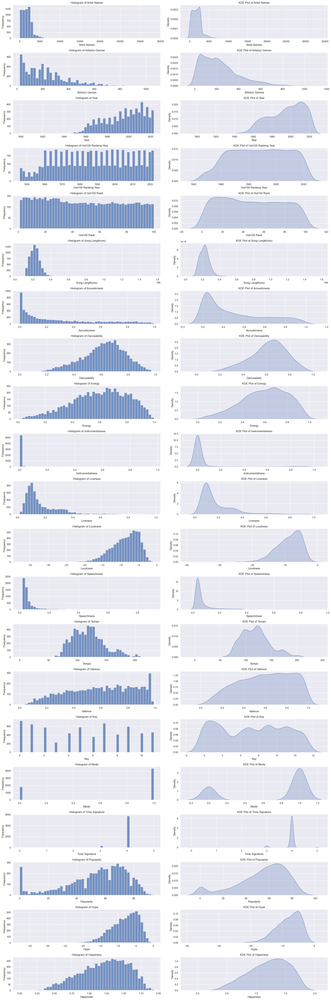

In [101]:
fig, axs = plt.subplots(len(df.columns), 2, figsize=(20, 60))

axs = axs.flatten()

for i, column in enumerate(df.columns):

    sns.histplot(df[column], bins=50, ax=axs[2*i])
    axs[2*i].set_title(f'Histogram of {column}')
    axs[2*i].set_xlabel(column)
    axs[2*i].set_ylabel('Frequency')

    sns.kdeplot(df[column], ax=axs[2*i+1], fill=True)
    axs[2*i+1].set_title(f'KDE Plot of {column}')
    axs[2*i+1].set_xlabel(column)
    axs[2*i+1].set_ylabel('Density')
plt.tight_layout()
plt.show()

## To address the skewed distributions, I will apply both a log transformation and a square root transformation to the relevant features.


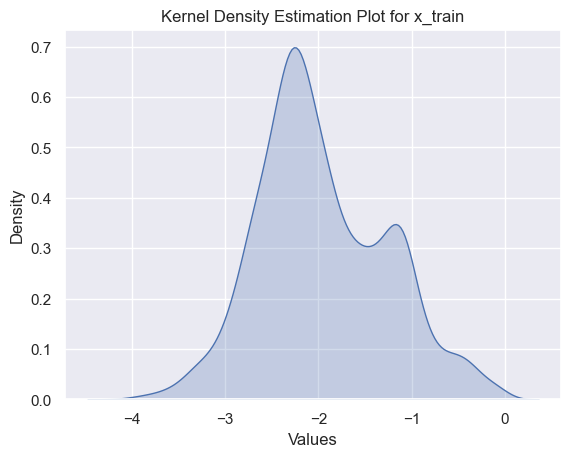

In [102]:
offset = 1e-10

X_train['Liveness_log'] = np.log(X_train['Liveness'] + offset)

sns.kdeplot(X_train['Liveness_log'], fill=True)
plt.title('Kernel Density Estimation Plot for x_train')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

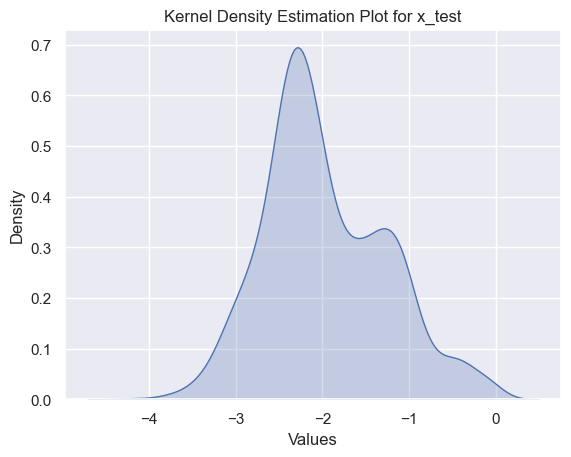

In [103]:
X_test['Liveness_log'] = np.log(X_test['Liveness'] + offset)

sns.kdeplot(X_test['Liveness_log'], fill=True)
plt.title('Kernel Density Estimation Plot for x_test')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

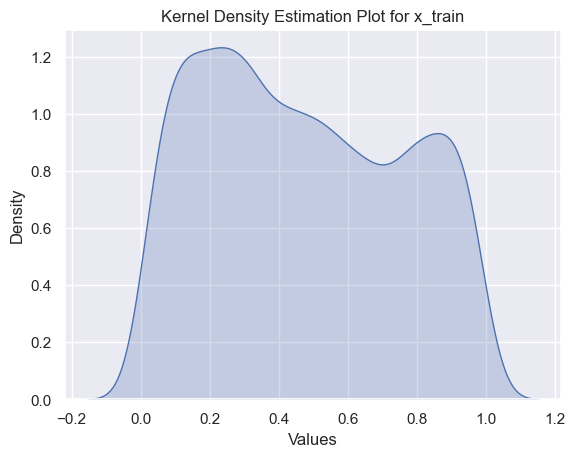

In [104]:
offset = 1e-10

X_train['Acousticness_sqrt'] = np.sqrt(X_train['Acousticness'] + offset)

sns.kdeplot(X_train['Acousticness_sqrt'], fill=True)
plt.title('Kernel Density Estimation Plot for x_train')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

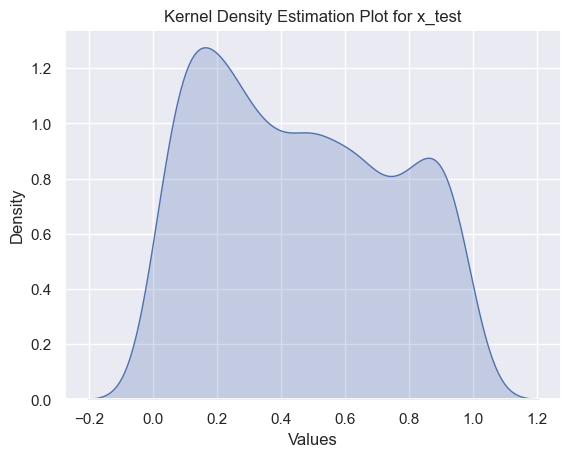

In [105]:
X_test['Acousticness_sqrt'] = np.sqrt(X_test['Acousticness'] + offset)

sns.kdeplot(X_test['Acousticness_sqrt'], fill=True)
plt.title('Kernel Density Estimation Plot for x_test')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

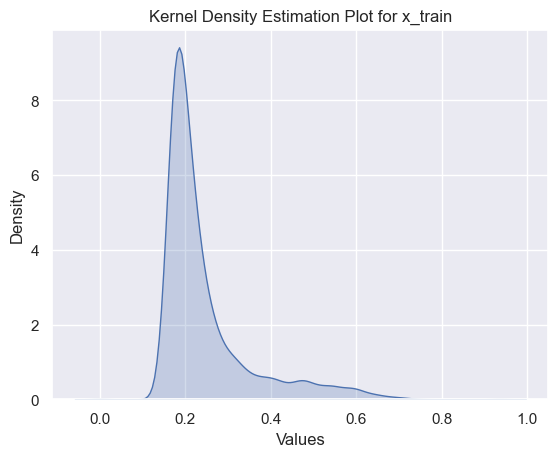

In [106]:
X_train['Speechiness_sqrt'] = np.sqrt(X_train['Speechiness'])

sns.kdeplot(X_train['Speechiness_sqrt'], fill=True, warn_singular=False)
plt.title('Kernel Density Estimation Plot for x_train')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

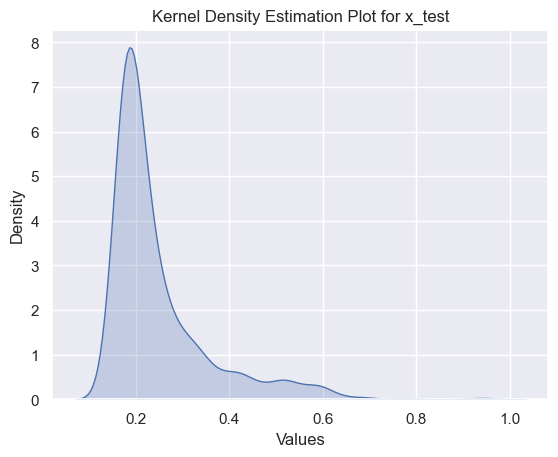

In [107]:
X_test['Speechiness_sqrt'] = np.sqrt(X_test['Speechiness'])
sns.kdeplot(X_test['Speechiness_sqrt'], fill=True, warn_singular=False)
plt.title('Kernel Density Estimation Plot for x_test')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

In [108]:
X_train.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness_log,Acousticness_sqrt,Speechiness_sqrt
845,631.0,472.223222,1983,1984,22,257093,0.11800,0.774,0.788,0.0000,0.1530,-7.069,0.0281,114.152,0.972,4,0,4,-6.281,1.746,-1.877317,0.343511,0.167631
1937,1205.0,56.901099,1978,1978,50,240693,0.00113,0.497,0.718,0.0606,0.5440,-7.744,0.0275,127.790,0.792,0,1,4,-7.026,1.289,-0.608806,0.033615,0.165831
3328,6897.0,719.015436,2011,2012,86,281280,0.06970,0.523,0.742,0.0000,0.1020,-5.495,0.2270,83.066,0.353,7,0,4,-4.753,0.876,-2.282782,0.264008,0.476445
1506,2018.0,273.237027,2016,2016,65,256533,0.23300,0.675,0.562,0.0000,0.0816,-7.678,0.0352,130.098,0.309,7,1,4,-7.116,0.984,-2.505926,0.482701,0.187617
3576,2717.0,353.914563,1974,1974,100,196653,0.58500,0.816,0.631,0.0000,0.4770,-10.746,0.0541,110.497,0.718,7,1,4,-10.115,1.534,-0.740239,0.764853,0.232594


In [109]:
columns_to_drop = ['Liveness','Acousticness','Speechiness']

X_train.drop(columns_to_drop, axis=1, inplace=True)
X_train.reset_index(drop=True, inplace=True)
X_train.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Danceability,Energy,Instrumentalness,Loudness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness_log,Acousticness_sqrt,Speechiness_sqrt
0,631.0,472.223222,1983,1984,22,257093,0.774,0.788,0.0000,-7.069,114.152,0.972,4,0,4,-6.281,1.746,-1.877317,0.343511,0.167631
1,1205.0,56.901099,1978,1978,50,240693,0.497,0.718,0.0606,-7.744,127.790,0.792,0,1,4,-7.026,1.289,-0.608806,0.033615,0.165831
2,6897.0,719.015436,2011,2012,86,281280,0.523,0.742,0.0000,-5.495,83.066,0.353,7,0,4,-4.753,0.876,-2.282782,0.264008,0.476445
3,2018.0,273.237027,2016,2016,65,256533,0.675,0.562,0.0000,-7.678,130.098,0.309,7,1,4,-7.116,0.984,-2.505926,0.482701,0.187617
4,2717.0,353.914563,1974,1974,100,196653,0.816,0.631,0.0000,-10.746,110.497,0.718,7,1,4,-10.115,1.534,-0.740239,0.764853,0.232594


In [110]:
column_names = {
    'Liveness_log': 'Liveness',
    'Acousticness_sqrt': 'Acousticness',
    'Speechiness_sqrt':'Speechiness'
}

X_train = X_train.rename(columns=column_names)
X_train.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Danceability,Energy,Instrumentalness,Loudness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness,Acousticness,Speechiness
0,631.0,472.223222,1983,1984,22,257093,0.774,0.788,0.0000,-7.069,114.152,0.972,4,0,4,-6.281,1.746,-1.877317,0.343511,0.167631
1,1205.0,56.901099,1978,1978,50,240693,0.497,0.718,0.0606,-7.744,127.790,0.792,0,1,4,-7.026,1.289,-0.608806,0.033615,0.165831
2,6897.0,719.015436,2011,2012,86,281280,0.523,0.742,0.0000,-5.495,83.066,0.353,7,0,4,-4.753,0.876,-2.282782,0.264008,0.476445
3,2018.0,273.237027,2016,2016,65,256533,0.675,0.562,0.0000,-7.678,130.098,0.309,7,1,4,-7.116,0.984,-2.505926,0.482701,0.187617
4,2717.0,353.914563,1974,1974,100,196653,0.816,0.631,0.0000,-10.746,110.497,0.718,7,1,4,-10.115,1.534,-0.740239,0.764853,0.232594


In [111]:
X_test.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness_log,Acousticness_sqrt,Speechiness_sqrt
1153,2408.0,424.005156,1992,1993,62,293600,0.0267,0.744,0.851,0.007380,0.0989,-10.108,0.0490,105.882,0.626,10,0,4,-9.257,1.370,-2.313646,0.163401,0.221359
4202,1045.0,594.396977,1974,1975,62,175360,0.2530,0.554,0.927,0.000000,0.1190,-3.163,0.0428,125.155,0.853,9,0,4,-2.236,1.407,-2.128632,0.502991,0.206882
437,145.0,27.129265,1974,1960,41,171301,0.9020,0.350,0.124,0.000021,0.1340,-18.923,0.0339,117.169,0.320,7,1,4,-18.799,0.670,-2.009915,0.949737,0.184120
4736,1462.0,205.119230,2018,1982,82,211680,0.1560,0.877,0.560,0.000139,0.0535,-8.529,0.0621,110.860,0.969,7,1,4,-7.969,1.846,-2.928074,0.394968,0.249199
4124,119.0,21.893058,2013,1953,29,190776,0.2120,0.744,0.221,0.846000,0.0669,-21.665,0.0310,139.923,0.793,3,1,4,-21.444,1.537,-2.704556,0.460435,0.176068


In [112]:
columns_to_drop = ['Liveness','Acousticness','Speechiness']

X_test.drop(columns_to_drop, axis=1, inplace=True)
X_test.reset_index(drop=True, inplace=True)
X_test.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Danceability,Energy,Instrumentalness,Loudness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness_log,Acousticness_sqrt,Speechiness_sqrt
0,2408.0,424.005156,1992,1993,62,293600,0.744,0.851,0.007380,-10.108,105.882,0.626,10,0,4,-9.257,1.370,-2.313646,0.163401,0.221359
1,1045.0,594.396977,1974,1975,62,175360,0.554,0.927,0.000000,-3.163,125.155,0.853,9,0,4,-2.236,1.407,-2.128632,0.502991,0.206882
2,145.0,27.129265,1974,1960,41,171301,0.350,0.124,0.000021,-18.923,117.169,0.320,7,1,4,-18.799,0.670,-2.009915,0.949737,0.184120
3,1462.0,205.119230,2018,1982,82,211680,0.877,0.560,0.000139,-8.529,110.860,0.969,7,1,4,-7.969,1.846,-2.928074,0.394968,0.249199
4,119.0,21.893058,2013,1953,29,190776,0.744,0.221,0.846000,-21.665,139.923,0.793,3,1,4,-21.444,1.537,-2.704556,0.460435,0.176068


In [113]:
column_names = {
    'Liveness_log': 'Liveness',
    'Acousticness_sqrt': 'Acousticness',
    'Speechiness_sqrt':'Speechiness'
}

X_test = X_test.rename(columns=column_names)
X_test.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Danceability,Energy,Instrumentalness,Loudness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness,Acousticness,Speechiness
0,2408.0,424.005156,1992,1993,62,293600,0.744,0.851,0.007380,-10.108,105.882,0.626,10,0,4,-9.257,1.370,-2.313646,0.163401,0.221359
1,1045.0,594.396977,1974,1975,62,175360,0.554,0.927,0.000000,-3.163,125.155,0.853,9,0,4,-2.236,1.407,-2.128632,0.502991,0.206882
2,145.0,27.129265,1974,1960,41,171301,0.350,0.124,0.000021,-18.923,117.169,0.320,7,1,4,-18.799,0.670,-2.009915,0.949737,0.184120
3,1462.0,205.119230,2018,1982,82,211680,0.877,0.560,0.000139,-8.529,110.860,0.969,7,1,4,-7.969,1.846,-2.928074,0.394968,0.249199
4,119.0,21.893058,2013,1953,29,190776,0.744,0.221,0.846000,-21.665,139.923,0.793,3,1,4,-21.444,1.537,-2.704556,0.460435,0.176068


## Scaling

### Normalization ###

During the scaling process, the dataset was initially partitioned to avoid data leakage. Min-Max scaling was employed as it useful when data is not Gaussian, while Standard scaling was not utilized. Standard scaling is typically applied to normally distributed data, making Min-Max scaling the preferred choice for this dataset. 

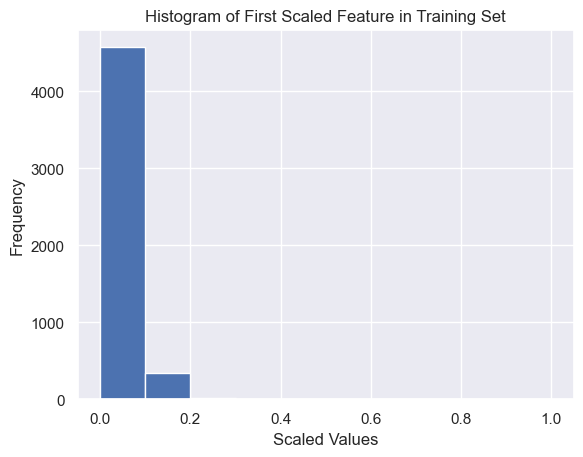

In [114]:
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

y_scaler = MinMaxScaler()

y_train_scaled = y_scaler.fit_transform(y_train.values.reshape(-1, 1))
y_test_scaled = y_scaler.transform(y_test.values.reshape(-1, 1))

y_train_scaled_df = pd.DataFrame(y_train_scaled, columns=['Scaled Popularity'])
y_test_scaled_df = pd.DataFrame(y_test_scaled, columns=['Scaled Popularity'])

plt.hist(X_train_scaled_df.iloc[:, 0])
plt.title('Histogram of First Scaled Feature in Training Set')
plt.xlabel('Scaled Values')
plt.ylabel('Frequency')
plt.show()

In [115]:
X_train_scaled_df.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Danceability,Energy,Instrumentalness,Loudness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness,Acousticness,Speechiness
0,0.018881,0.433517,0.677419,0.500000,0.212121,0.136016,0.783401,0.788618,0.000000,0.830979,0.491033,0.985801,0.363636,0.0,0.8,0.830598,0.904195,0.544075,0.343120,0.178593
1,0.036085,0.033701,0.637097,0.421053,0.494949,0.125150,0.503036,0.717480,0.062346,0.812751,0.549698,0.803245,0.000000,1.0,0.8,0.810973,0.667530,0.854815,0.031853,0.176676
2,0.206677,0.671095,0.903226,0.868421,0.858586,0.152041,0.529352,0.741870,0.000000,0.873484,0.357315,0.358012,0.636364,0.0,0.8,0.870848,0.453651,0.444750,0.263265,0.507604
3,0.060451,0.241960,0.943548,0.921053,0.646465,0.135645,0.683198,0.558943,0.000000,0.814534,0.559626,0.313387,0.636364,1.0,0.8,0.808603,0.509581,0.390088,0.482926,0.199886
4,0.081400,0.319625,0.604839,0.368421,1.000000,0.095972,0.825911,0.629065,0.000000,0.731684,0.475311,0.728195,0.636364,1.0,0.8,0.729604,0.794407,0.822619,0.766327,0.247805


In [116]:
X_test_scaled_df.head()

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Danceability,Energy,Instrumentalness,Loudness,Tempo,Valence,Key,Mode,Time Signature,Hype,Happiness,Liveness,Acousticness,Speechiness
0,0.072139,0.387099,0.750000,0.618421,0.616162,0.160203,0.753036,0.852642,0.007593,0.748913,0.455459,0.634888,0.909091,0.0,0.8,0.752205,0.709477,0.437190,0.162213,0.235836
1,0.031289,0.551129,0.604839,0.381579,0.616162,0.081864,0.560729,0.929878,0.000000,0.936459,0.538364,0.865112,0.818182,0.0,0.8,0.937149,0.728638,0.482512,0.503306,0.220411
2,0.004316,0.005041,0.604839,0.184211,0.404040,0.079175,0.354251,0.113821,0.000021,0.510869,0.504011,0.324544,0.636364,1.0,0.8,0.500855,0.346970,0.511593,0.952029,0.196161
3,0.043787,0.176385,0.959677,0.473684,0.818182,0.105928,0.887652,0.556911,0.000143,0.791553,0.476873,0.982759,0.636364,1.0,0.8,0.786133,0.955981,0.286677,0.394805,0.265496
4,0.003537,0.000000,0.919355,0.092105,0.282828,0.092078,0.753036,0.212398,0.870370,0.436823,0.601889,0.804260,0.272727,1.0,0.8,0.431181,0.795961,0.341431,0.460561,0.187583


In [117]:
X_train=X_train_scaled_df
X_test =X_test_scaled_df
y_train=y_train_scaled_df
y_test=y_test_scaled_df

# Feature Selection

In [118]:
df[df['Year']>df['Hot100 Ranking Year']]

,Artist Names,Artist(s) Genres,Year,Hot100 Ranking Year,Hot100 Rank,Song Length(ms),Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Valence,Key,Mode,Time Signature,Popularity,Hype,Happiness
0,1504.0,241.574119,2001,2000,44,229826,0.0200,0.478,0.736,0.000096,0.1180,-7.124,0.0367,144.705,0.564,7,1,4,62,-6.388,1.042
4,2619.0,21.893058,2011,2006,50,251013,0.0149,0.843,0.348,0.001280,0.2470,-10.669,0.0545,143.595,0.385,7,0,4,0,-10.321,1.228
13,2782.0,48.370832,1992,1961,48,148466,0.7070,0.493,0.244,0.000462,0.1210,-11.487,0.0277,87.044,0.222,5,1,3,43,-11.243,0.715
14,1581.0,104.546573,2006,1961,79,151693,0.6190,0.698,0.806,0.000000,0.9000,-8.681,0.1040,113.811,0.934,7,1,4,28,-7.875,1.632
16,797.0,468.880133,1983,1982,58,188533,0.0104,0.486,0.830,0.000475,0.0635,-10.815,0.0370,151.869,0.652,3,1,4,59,-9.985,1.138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6154,1967.0,73.514306,1988,1949,4,208466,0.9340,0.193,0.095,0.001900,0.3240,-17.551,0.0362,89.418,0.231,0,1,3,30,-17.456,0.424
6155,1714.0,294.048519,1998,1983,35,165506,0.0803,0.632,0.582,0.003510,0.0832,-13.461,0.0440,101.641,0.578,5,1,4,62,-12.879,1.210
6157,1961.0,109.929360,2000,1988,60,256493,0.4750,0.963,0.822,0.000000,0.1700,-6.642,0.1060,118.499,0.908,2,1,4,48,-5.820,1.871
6162,3081.0,323.675439,2017,1958,30,166440,0.1690,0.884,0.709,0.000000,0.1360,-6.258,0.4180,75.027,0.495,3,1,4,52,-5.549,1.379


In [119]:
df[df['Year']>df['Hot100 Ranking Year']].shape[0]

1763

There are over 1760 rows, accounting for more than 28% of the data, with a 'rank year' of 0 even before the song's release year. This suggests that the 'rank year' column is largely inaccurate.

In [120]:
df['Time Signature'].value_counts()/df.shape[0]

Time Signature
4    0.932588
3    0.054610
5    0.008589
1    0.003727
0    0.000486
Name: count, dtype: float64

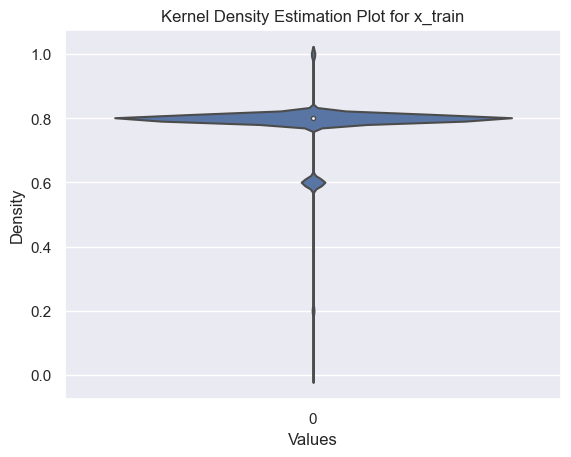

In [121]:
sns.violinplot(X_train['Time Signature'], fill=True)
plt.title('Kernel Density Estimation Plot for x_train')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

In [122]:
df['Instrumentalness'].value_counts()/df.shape[0]

Instrumentalness
0.000000    0.420677
0.000125    0.001296
0.000001    0.001134
0.001010    0.001134
0.000001    0.001134
              ...   
0.000003    0.000162
0.000051    0.000162
0.000073    0.000162
0.748000    0.000162
0.000059    0.000162
Name: count, Length: 2253, dtype: float64

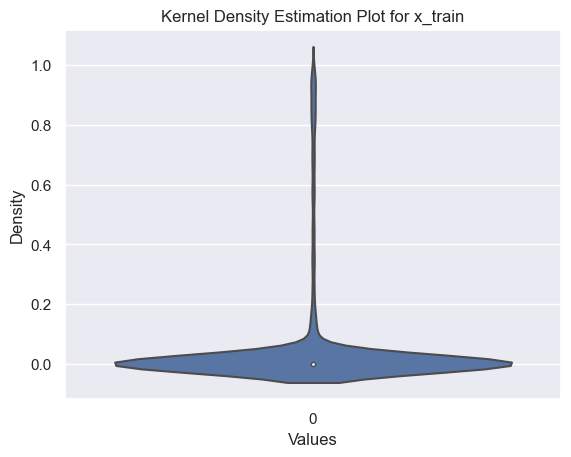

In [123]:
sns.violinplot(X_train['Instrumentalness'], fill=True)
plt.title('Kernel Density Estimation Plot for x_train')
plt.xlabel('Values')
plt.ylabel('Density')
plt.show()

Instrumentalness and Time Signature will not be useddue to their negligible variance, indicating that they would not significantly influence the model. Specifically, over 99% of the Time Signature values were '4', and nearly half of the Instrumentalness values were zeros. 

##  Correlation heatmap

Since the correlation matrix is most informative with continuous data, I will exclude categorical data when generating the correlation heatmap.


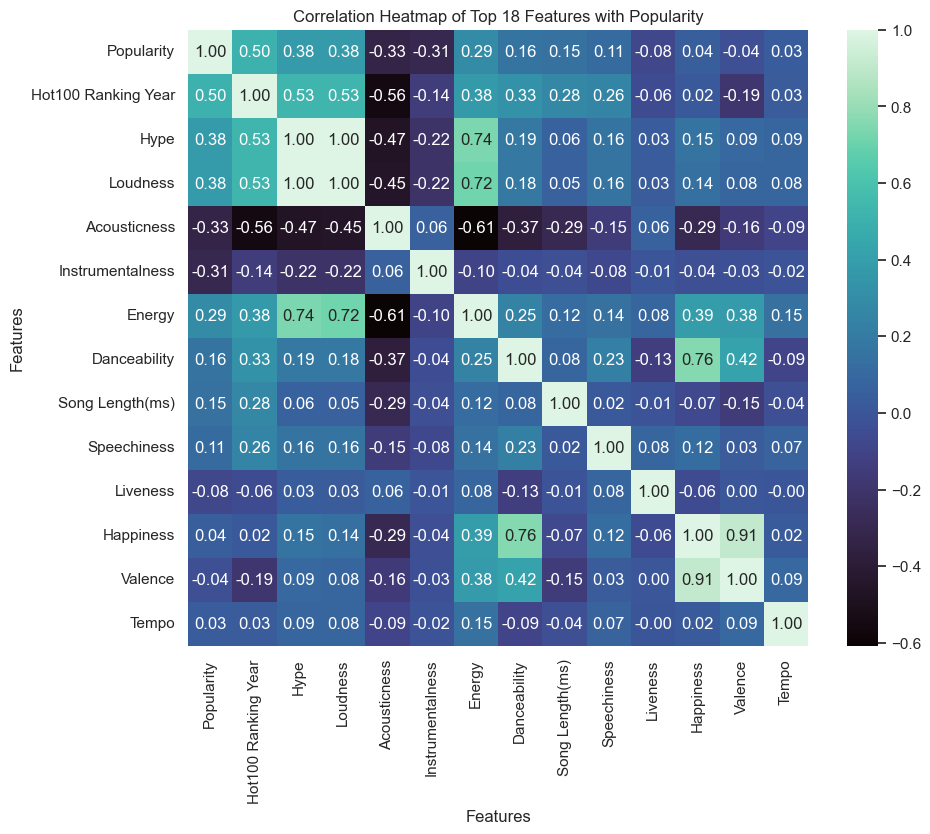

In [124]:
excluded_columns = [ 'Artist Names', 'Artist(s) Genres','Year','Hot100 Rank','Key','Mode','Time Signature']


X_correlation = df.drop(excluded_columns, axis=1)
y = df['Popularity']


numerical_features = X_correlation.select_dtypes(include=['int64', 'float64'])
categorical_features = X_correlation.select_dtypes(exclude=['int64', 'float64'])

numerical_correlations = numerical_features.corrwith(y)

sorted_correlations = numerical_correlations.abs().sort_values(ascending=False)
top_n_features = 18
top_features = sorted_correlations.index[:top_n_features]

top_feature_corr = X_correlation[top_features].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(top_feature_corr, annot=True, cmap='mako', fmt=".2f")
plt.title(f"Correlation Heatmap of Top {top_n_features} Features with Popularity")
plt.xlabel("Features")
plt.ylabel("Features")
plt.show()


##  Filter methods (SelectKBest)

### I will use SelectKBest to select some features and reduce the dimensionality of the model. First, I'll split the features into continuous and categorical. For the categorical features, I will select a subset using ANOVA, as the input is categorical and the output is numerical. For the continuous features, I will select a subset using both Pearson and Spearman correlation methods, as these are appropriate when both the input and output are numerical.


In [125]:
cat_columns = ['Artist Names', 'Artist(s) Genres', 'Year', 'Hot100 Rank', 'Key', 'Mode', 'Time Signature','Hot100 Ranking Year']

X_train_cat = X_train[cat_columns]

best_cat_features = SelectKBest(score_func=f_regression, k='all')

fit = best_cat_features.fit(X_train_cat, y_train)

df_scores = pd.DataFrame(fit.scores_, columns=['Score'])
df_columns = pd.DataFrame(X_train_cat.columns, columns=['Feature'])

featureScores = pd.concat([df_columns, df_scores], axis=1)

print(featureScores.nlargest(33, 'Score'))

               Feature        Score
7  Hot100 Ranking Year  1685.089278
1     Artist(s) Genres   589.849021
5                 Mode    59.832321
2                 Year    43.159868
3          Hot100 Rank    38.086366
6       Time Signature    32.804640
0         Artist Names     2.609181
4                  Key     2.274452


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [126]:
def spearman_corr(X, y):
    scores = []
    dummy_pvalues = [None] * X.shape[1]
    for feature in X.T:
        corr, _ = spearmanr(feature, y)
        scores.append(abs(corr))
    return scores, dummy_pvalues


In [127]:
cont_columns = df.drop(['Artist Names', 'Artist(s) Genres', 'Year', 'Hot100 Rank', 'Key', 'Mode', 'Time Signature','Popularity','Hot100 Ranking Year'], axis=1).columns

X_train_cont = X_train[cont_columns]

best_cont_features = SelectKBest(score_func=spearman_corr, k='all')

fit = best_cont_features.fit(X_train_cont, y_train)

df_scores = pd.DataFrame(fit.scores_, columns=['Score'])
df_columns = pd.DataFrame(X_train_cont.columns, columns=['Feature'])

featureScores = pd.concat([df_columns, df_scores], axis=1)

print(featureScores.nlargest(33, 'Score'))

             Feature     Score
6           Loudness  0.411262
10              Hype  0.409064
1       Acousticness  0.309086
3             Energy  0.262168
4   Instrumentalness  0.211925
0    Song Length(ms)  0.201803
2       Danceability  0.156096
7        Speechiness  0.152260
9            Valence  0.076781
5           Liveness  0.043025
8              Tempo  0.030857
11         Happiness  0.009169


In [128]:
selected_features =['Acousticness','Artist(s) Genres','Hot100 Ranking Year','Mode','Year','Hot100 Rank','Song Length(ms)','Hype']

X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]
X_train=X_train_selected
X_test =X_test_selected

In [129]:
X_train.head()

,Acousticness,Artist(s) Genres,Hot100 Ranking Year,Mode,Year,Hot100 Rank,Song Length(ms),Hype
0,0.343120,0.433517,0.500000,0.0,0.677419,0.212121,0.136016,0.830598
1,0.031853,0.033701,0.421053,1.0,0.637097,0.494949,0.125150,0.810973
2,0.263265,0.671095,0.868421,0.0,0.903226,0.858586,0.152041,0.870848
3,0.482926,0.241960,0.921053,1.0,0.943548,0.646465,0.135645,0.808603
4,0.766327,0.319625,0.368421,1.0,0.604839,1.000000,0.095972,0.729604


In [130]:
X_test.head()

,Acousticness,Artist(s) Genres,Hot100 Ranking Year,Mode,Year,Hot100 Rank,Song Length(ms),Hype
0,0.162213,0.387099,0.618421,0.0,0.750000,0.616162,0.160203,0.752205
1,0.503306,0.551129,0.381579,0.0,0.604839,0.616162,0.081864,0.937149
2,0.952029,0.005041,0.184211,1.0,0.604839,0.404040,0.079175,0.500855
3,0.394805,0.176385,0.473684,1.0,0.959677,0.818182,0.105928,0.786133
4,0.460561,0.000000,0.092105,1.0,0.919355,0.282828,0.092078,0.431181


# Modeling & Hyperparameter tuning 

**Hyperparameter Tuning**

Hyperparameter tuning was conducted using grid search, which systematically combined all possible combinations of hyperparameters provided. This approach aimed to identify the optimal hyperparameter values that yielded the best-performing models in terms of accuracy. The tuning process significantly enhanced the accuracy of the models by optimizing the hyperparameters. 

**Cross-Validation**

Cross-validation was employed to assess the generalization capability of the models and mitigate overfitting. This provided a more reliable estimate of a model's performance by averaging the evaluation results across multiple validation sets, thereby offering a more robust evaluation metric compared to a single train-test split. 

# Linear Regression

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Mean Cross-Validated MSE: 0.03064286084857142

Training Set Mean Squared Error (MSE): 0.030530084172362366
Test Set Metrics:
Mean Squared Error (MSE): 0.030767509891288524
Root Mean Squared Error: 0.1754066985359696
Mean Absolute Error: 0.12796408516909635
R-squared Score: 0.42652560110677795


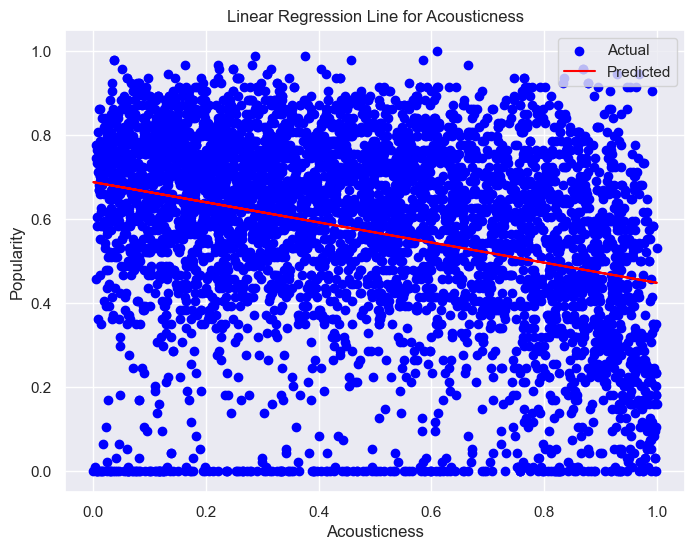

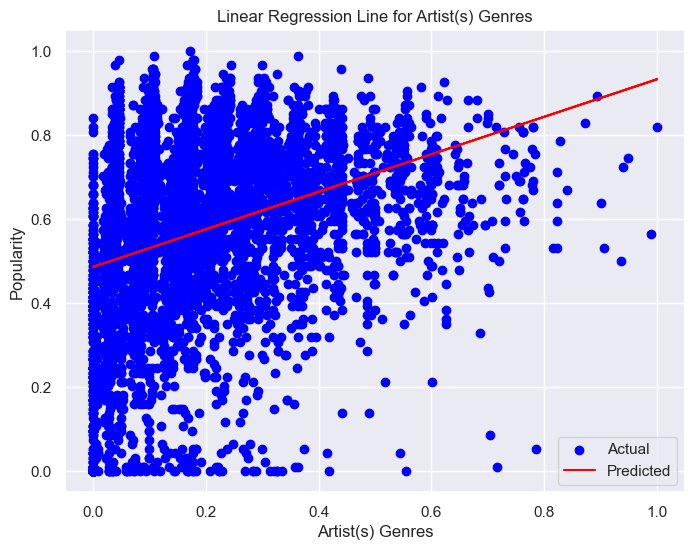

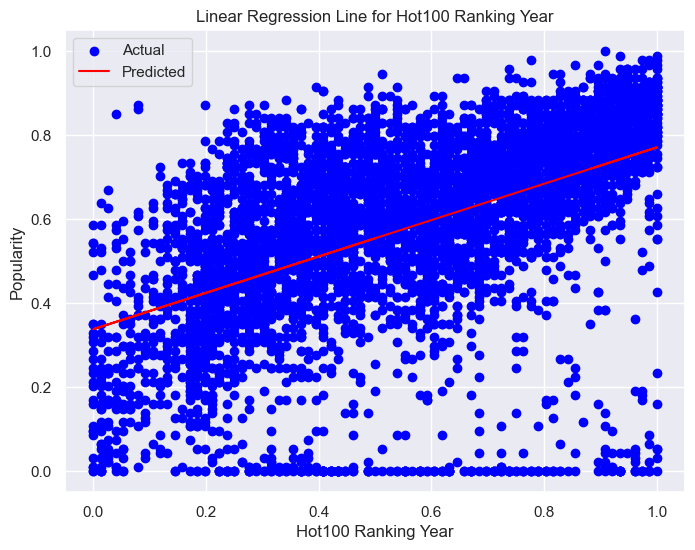

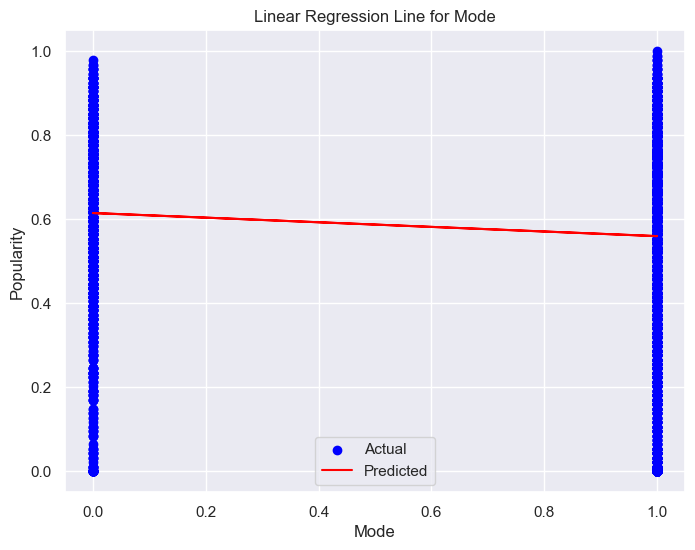

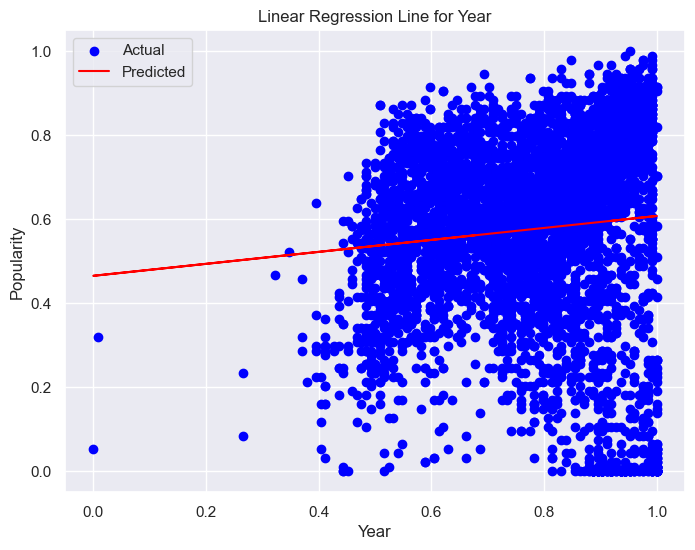

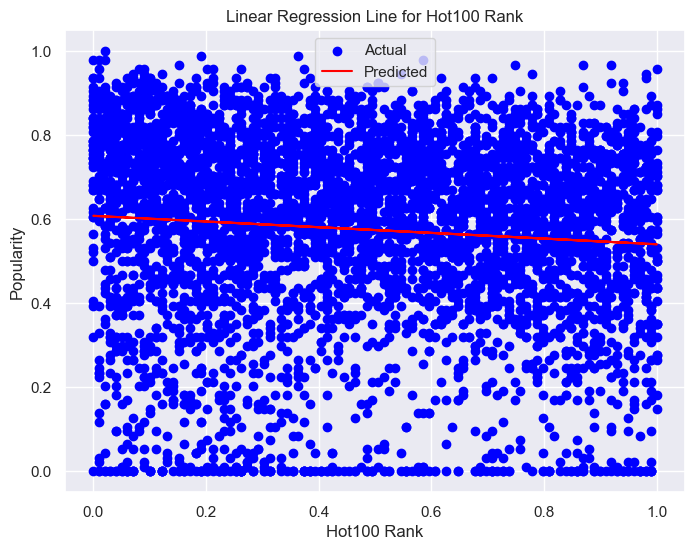

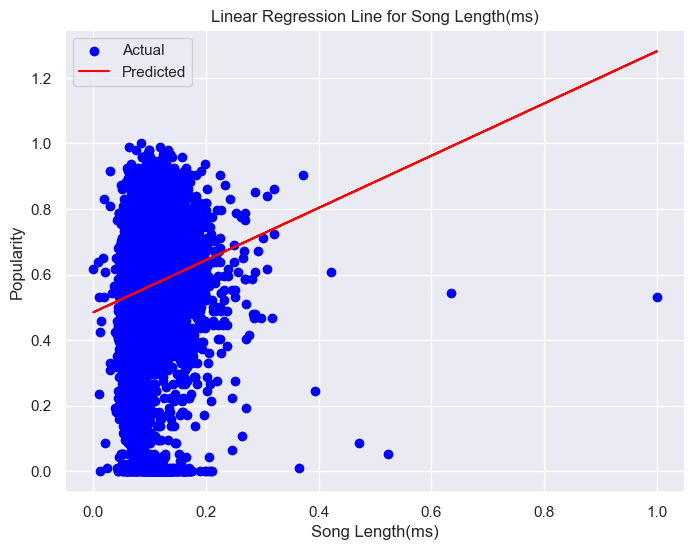

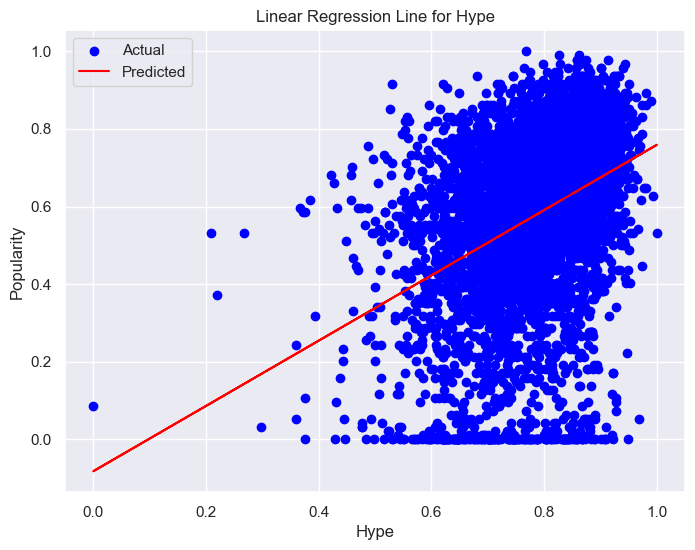

In [131]:

model = LinearRegression()
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
mean_mse = -np.mean(cv_scores)
 
print("Mean Cross-Validated MSE:", mean_mse)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse_test = mean_squared_error(y_test, y_pred)
RMSE = mean_squared_error(y_test, y_pred, squared=False)
MAE = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

y_pred_train = model.predict(X_train)
mse_train = mean_squared_error(y_train, y_pred_train)

print("\nTraining Set Mean Squared Error (MSE):", mse_train)
print("Test Set Metrics:")
print("Mean Squared Error (MSE):", mse_test)
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print("R-squared Score:", r2)



for i, feature in enumerate(selected_features):
   
    model.fit(X_train[[feature]], y_train)

    coefficients = model.coef_
    intercept = model.intercept_

    y_pred = model.predict(X_train[[feature]])

    plt.figure(figsize=(8, 6))
    plt.scatter(X_train[[feature]], y_train, color='blue', label='Actual')
    plt.plot(X_train[[feature]], y_pred, color='red', label='Predicted')
    plt.xlabel(feature)
    plt.ylabel('Popularity')
    plt.title(f'Linear Regression Line for {feature}')
    plt.legend()
    plt.show()

# Support Vector Machine (SVR) Regression

In [141]:
param_grid_svm = {
    'C': [0.1, 1, 10],  
    'gamma': [0.1, 1, 10], 
    'kernel': ['linear', 'rbf'] 
}

svm_model = SVR()

grid_search_svm = GridSearchCV(estimator=svm_model, param_grid=param_grid_svm, cv=5, scoring='neg_mean_squared_error',verbose=0)
grid_search_svm.fit(X_train_scaled, y_train)

best_params_svm = grid_search_svm.best_params_
best_score_svm = -grid_search_svm.best_score_  

svm_model_best = SVR(**best_params_svm)
svm_model_best.fit(X_train_scaled, y_train)

y_pred_svm = svm_model_best.predict(X_test_scaled)

mse_svm = mean_squared_error(y_test, y_pred_svm)
RMSE = mean_squared_error(y_test, y_pred_svm, squared=False)
MAE = mean_absolute_error(y_test, y_pred_svm)
r2_svm = r2_score(y_test, y_pred_svm)

print("Support Vector Machine (SVM) Regression:")
print(f"Best hyperparameters: {best_params_svm}")
print(f"Mean cross-validation error: {best_score_svm}")  
print(f"Mean squared error: {mse_svm}")
print(f"Root mean squared error: {RMSE}")
print("Mean Absolute Error:", MAE)
print(f"R-squared score: {r2_svm}")

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\util

Support Vector Machine (SVM) Regression:
Best hyperparameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Mean cross-validation error: 0.02679188011142495
Mean squared error: 0.02364065098569238
Root mean squared error: 0.15375516572035028
Mean Absolute Error: 0.11139626870966297
R-squared score: 0.5593628421225276


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



# Decision Tree Regressor

In [133]:
param_grid_dt = {
    'max_depth': [None, 5, 10, 15], 
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 4] 
}

dt_model = DecisionTreeRegressor()

grid_search_dt = GridSearchCV(estimator=dt_model, param_grid=param_grid_dt, cv=5, scoring='neg_mean_squared_error')
grid_search_dt.fit(X_train, y_train)

best_params_dt = grid_search_dt.best_params_
best_score_dt = -grid_search_dt.best_score_  

dt_model_best = DecisionTreeRegressor(**best_params_dt)
dt_model_best.fit(X_train, y_train)

y_pred_dt = dt_model_best.predict(X_test)

mse_dt = mean_squared_error(y_test, y_pred_dt)
RMSE = mean_squared_error(y_test, y_pred_dt, squared=False)
MAE = mean_absolute_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print("\nDecision Tree Regression:")
print(f"Best hyperparameters: {best_params_dt}")
print(f"Mean cross-validation error: {best_score_dt}") 
print(f"Mean squared error: {mse_dt}")
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print(f"R-squared score: {r2_dt}")


Decision Tree Regression:
Best hyperparameters: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10}
Mean cross-validation error: 0.02300366021603647
Mean squared error: 0.022309474807185516
Root Mean Squared Error: 0.14936356586258082
Mean Absolute Error: 0.10894726894194527
R-squared score: 0.5841745822174368


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



# Polynomial Regression

## Degree 3

Polynomial Regression (degree=3):
Mean squared error (CV): 0.025753112894161535
Mean squared error: 0.023946517278389555
Root Mean Squared Error: 0.15474662283355187
Mean Absolute Error: 0.11240978380328935
R-squared score: 0.5536618124010461


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



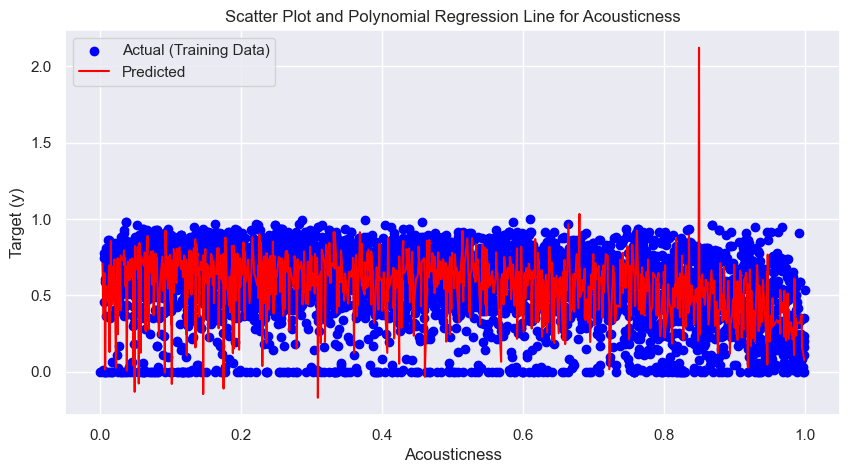

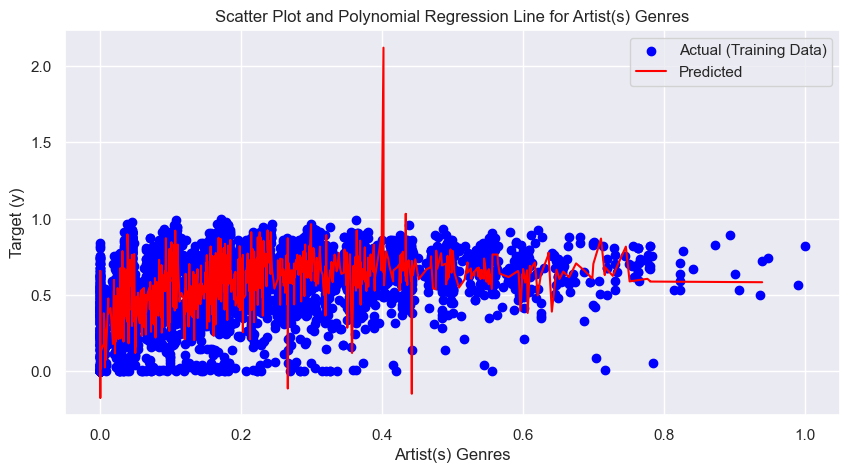

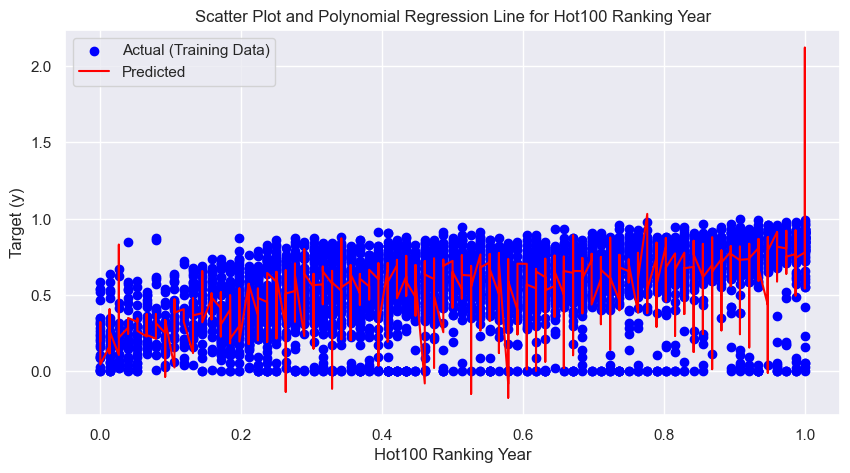

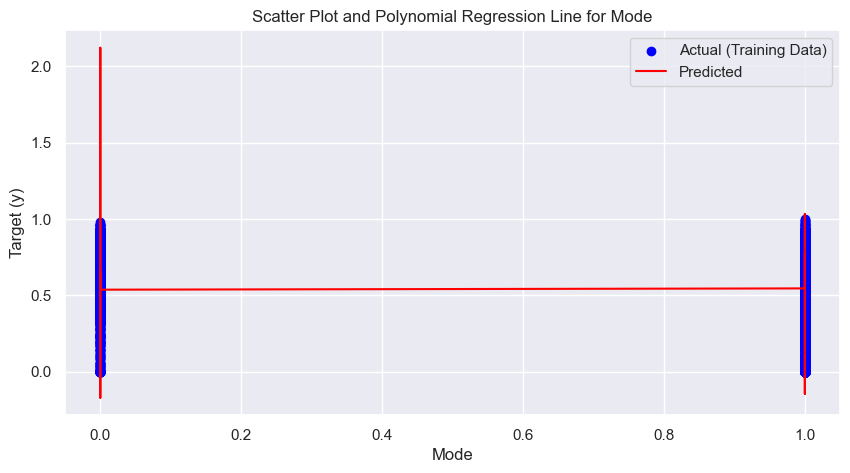

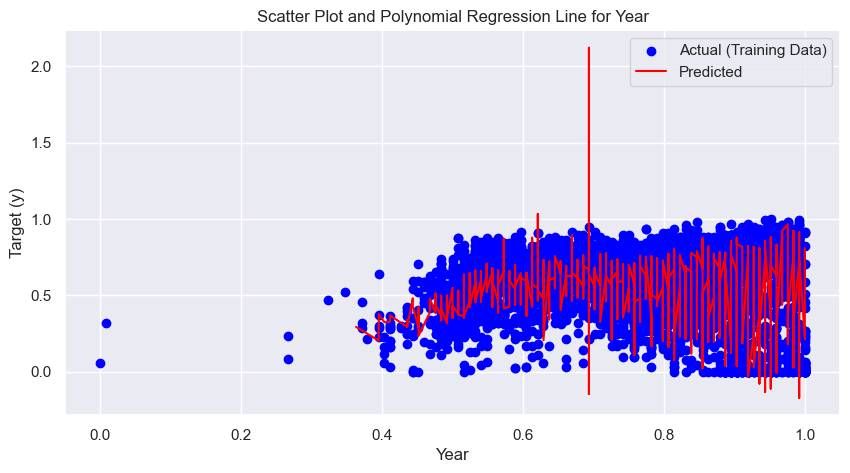

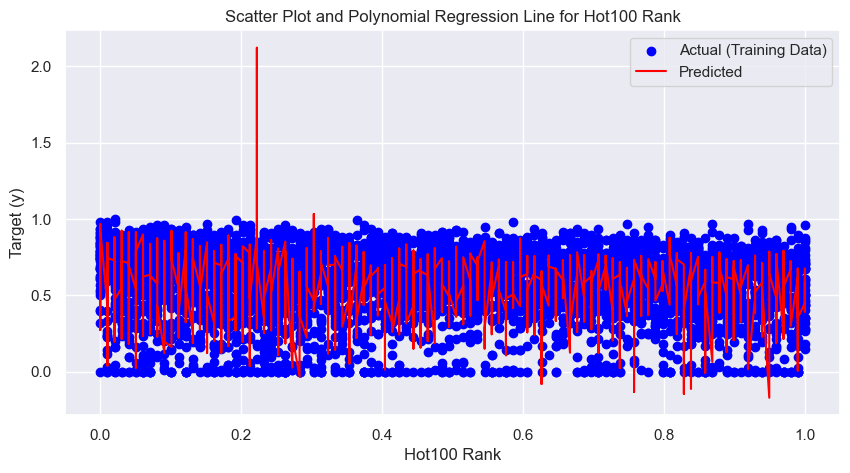

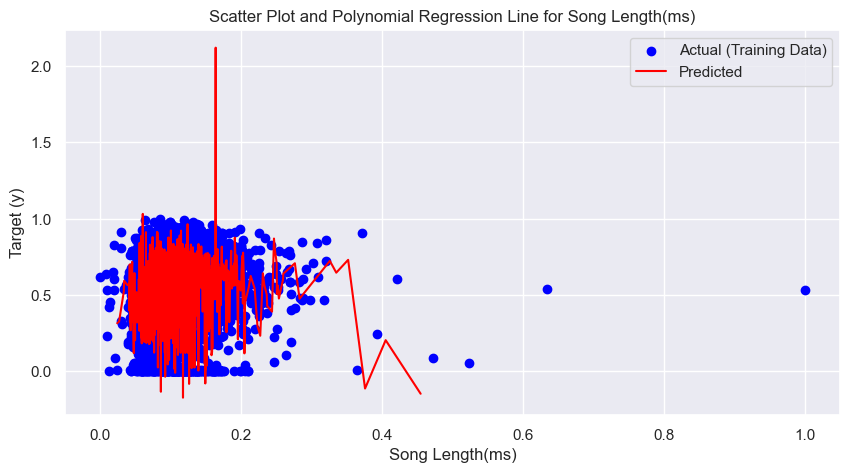

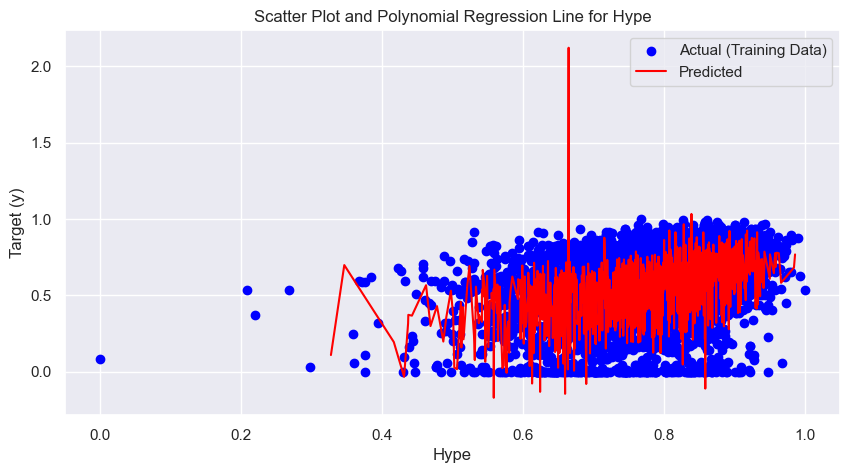

In [143]:
degree = 3
poly = PolynomialFeatures(degree=degree)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred = model.predict(X_test_poly)
 
cv_scores = cross_val_score(model, X_train_poly, y_train, cv=5, scoring='neg_mean_squared_error')
mean_mse_cv = -np.mean(cv_scores)
 
print(f"Polynomial Regression (degree={degree}):")
print(f"Mean squared error (CV): {mean_mse_cv}")
 
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
RMSE = mean_squared_error(y_test, y_pred, squared=False)
MAE = mean_absolute_error(y_test, y_pred)
print(f"Mean squared error: {mse}")
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print(f"R-squared score: {r2}")
 
for i, feature in enumerate(selected_features):
    plt.figure(figsize=(10, 5))
 
    plt.scatter(X_train[feature], y_train, color='blue', label='Actual (Training Data)')
 
    sorted_indices = X_test[feature].argsort()
    plt.plot(X_test[feature][sorted_indices], y_pred[sorted_indices], color='red', label='Predicted')
 
    plt.title(f'Scatter Plot and Polynomial Regression Line for {feature}')
    plt.xlabel(feature)
    plt.ylabel('Target (y)')
    plt.legend()
    plt.show()

## Degree 2

In [144]:
degree = 2
poly = PolynomialFeatures(degree=degree)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred = model.predict(X_test_poly)
 
cv_scores = cross_val_score(model, X_train_poly, y_train, cv=5, scoring='neg_mean_squared_error')
mean_mse_cv = -np.mean(cv_scores)
 
print(f"Polynomial Regression (degree={degree}):")
print(f"Mean squared error (CV): {mean_mse_cv}")
 
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
RMSE = mean_squared_error(y_test, y_pred, squared=False)
MAE = mean_absolute_error(y_test, y_pred)
print(f"Mean squared error: {mse}")
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print(f"R-squared score: {r2}")

Polynomial Regression (degree=2):
Mean squared error (CV): 0.027041647374290288
Mean squared error: 0.02581685892686747
Root Mean Squared Error: 0.16067625501880317
Mean Absolute Error: 0.12014215938373975
R-squared score: 0.5188005884548884


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



# Random Forest Regressor

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning:

A column-vector y 

Random Forest regression:
Best hyperparameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}
Mean cross-validation error: 0.019599309537988087
Mean squared error: 0.018050108976868182
Root Mean Squared Error: 0.13435069399473967
Mean Absolute Error: 0.09869859715548565
R-squared score: 0.663564733316378


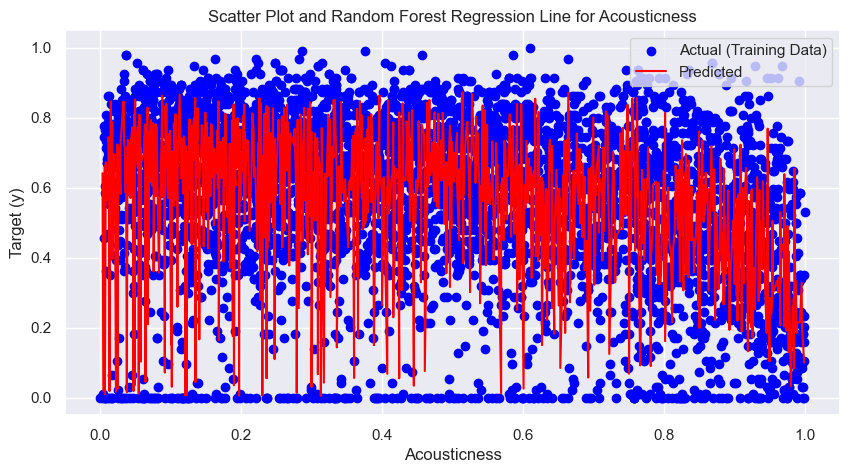

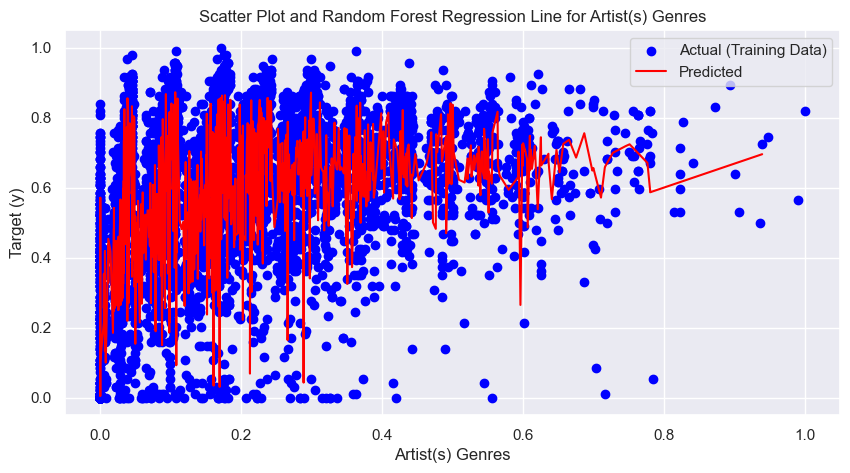

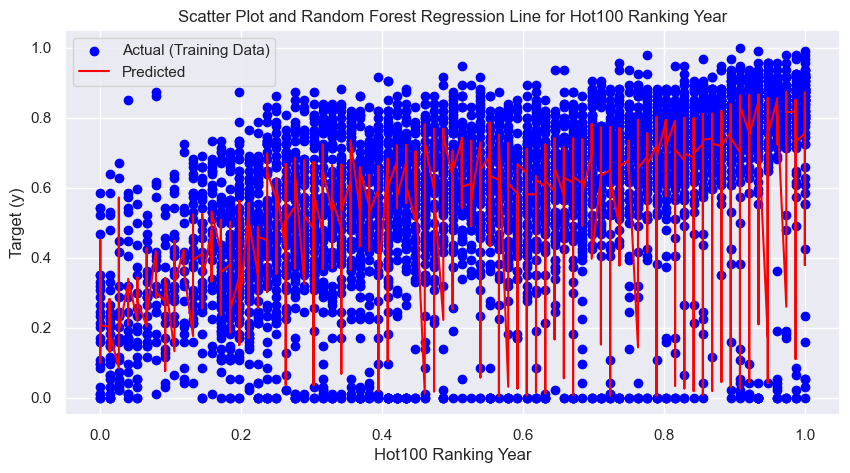

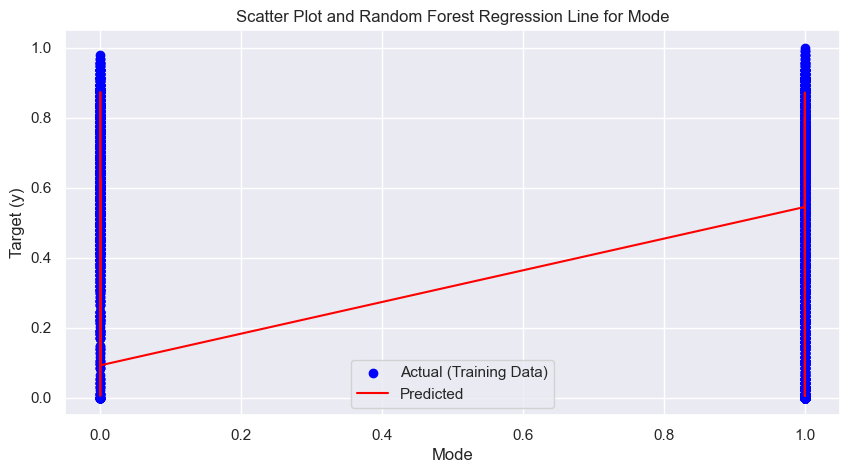

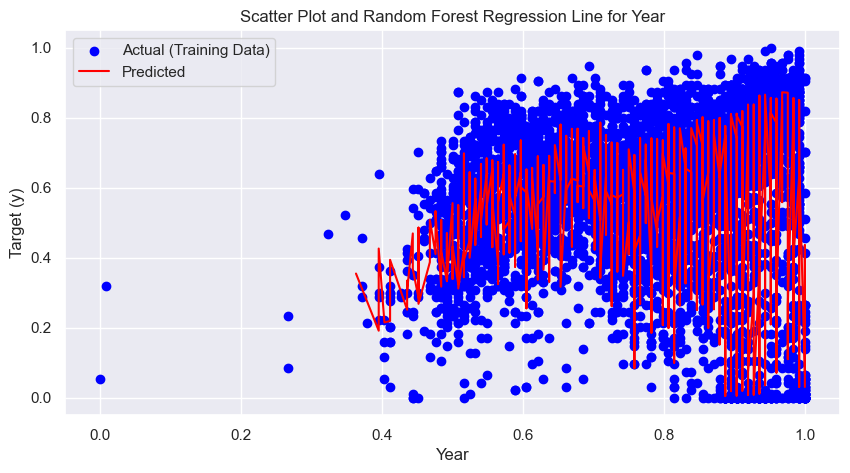

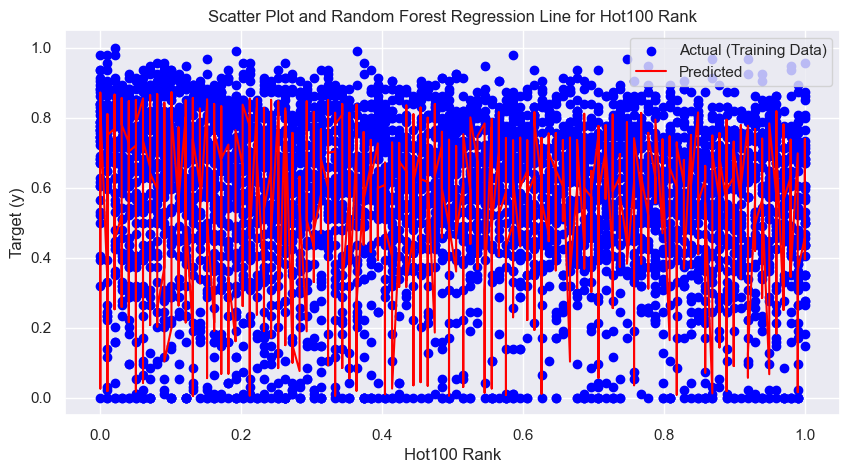

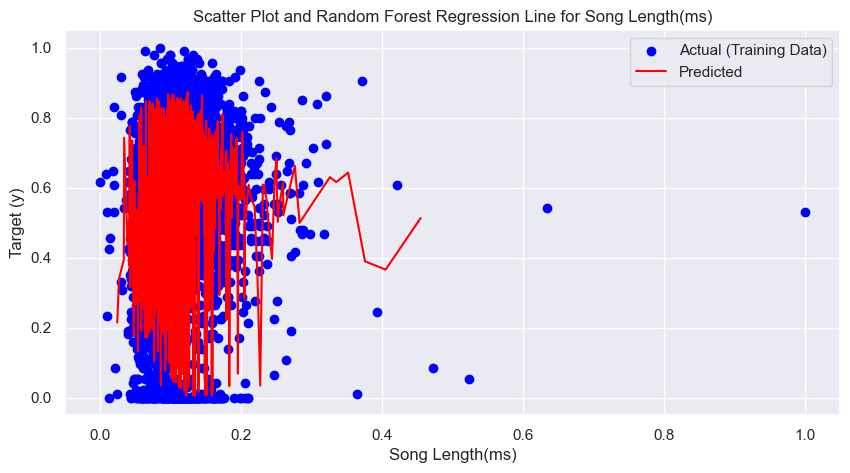

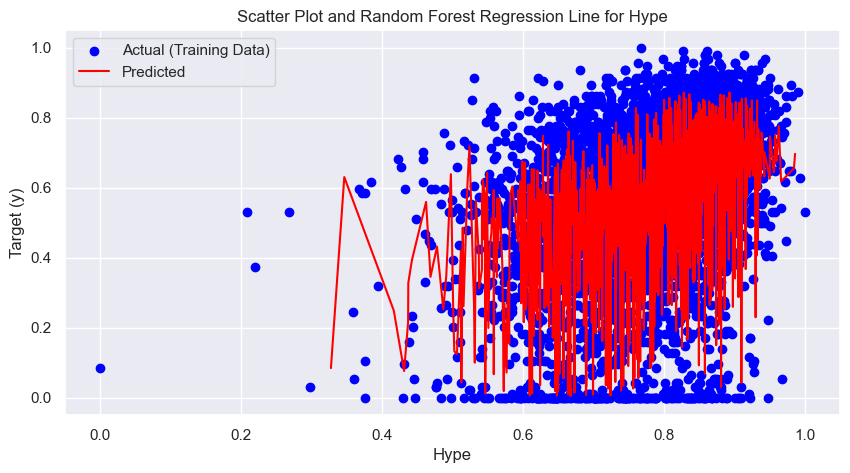

In [136]:

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_regressor = RandomForestRegressor(random_state=42)

grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=0)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_score = -grid_search.best_score_  
#best_params = {'max_depth': None,'min_samples_leaf': 2,'min_samples_split': 5,'n_estimators': 150}
rf_best = RandomForestRegressor(**best_params, random_state=42)
rf_best.fit(X_train, y_train)

y_pred = rf_best.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
RMSE = mean_squared_error(y_test, y_pred, squared=False)
MAE = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Random Forest regression:")
print("Best hyperparameters:", best_params)
print(f"Mean cross-validation error: {best_score}")  
print("Mean squared error:", mse)
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print("R-squared score:", r2)

for i, feature in enumerate(selected_features):
    plt.figure(figsize=(10, 5))
    plt.scatter(X_train[feature], y_train, color='blue', label='Actual (Training Data)')

    sorted_indices = X_test[feature].argsort()

    plt.plot(X_test[feature][sorted_indices], y_pred[sorted_indices], color='red', label='Predicted')

    plt.title(f'Scatter Plot and Random Forest Regression Line for {feature}')
    plt.xlabel(feature)
    plt.ylabel('Target (y)')
    plt.legend()
    plt.show()

# XGBoost Regression

In [137]:
#!pip install xgboost -q

In [138]:
param_grid = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300]
}

xgb_regressor = xgb.XGBRegressor()

grid_search = GridSearchCV(estimator=xgb_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error',verbose=0)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_score = -grid_search.best_score_  
best_params = {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}

best_xgb_regressor = xgb.XGBRegressor(**best_params)
best_xgb_regressor.fit(X_train, y_train)

y_pred = best_xgb_regressor.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
RMSE = mean_squared_error(y_test, y_pred, squared=False)
MAE = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("XGBoost regression:")
print("Best hyperparameters:", best_params)
print(f"Mean cross-validation error: {best_score}") 
print("Mean squared error:", mse)
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print("R-squared score:", r2)

XGBoost regression:
Best hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Mean cross-validation error: 0.01951636057772324
Mean squared error: 0.01802356187746808
Root Mean Squared Error: 0.13425185986595523
Mean Absolute Error: 0.09999520046725531
R-squared score: 0.6640595436511962


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



# Lasso Regression

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: 0.001
Best MSE: 0.03093903230247912
Test MSE: 0.03139920478373824
Mean Score: 0.030007579795205946
Standard Deviation Score: 0.003520597805276883
Mean Squared Error =  0.028992806775098037
Root Mean Squared Error =  0.1702727423139066
Mean absolute Error =  0.1259128146258776
R2_score =  0.4596042222356015


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



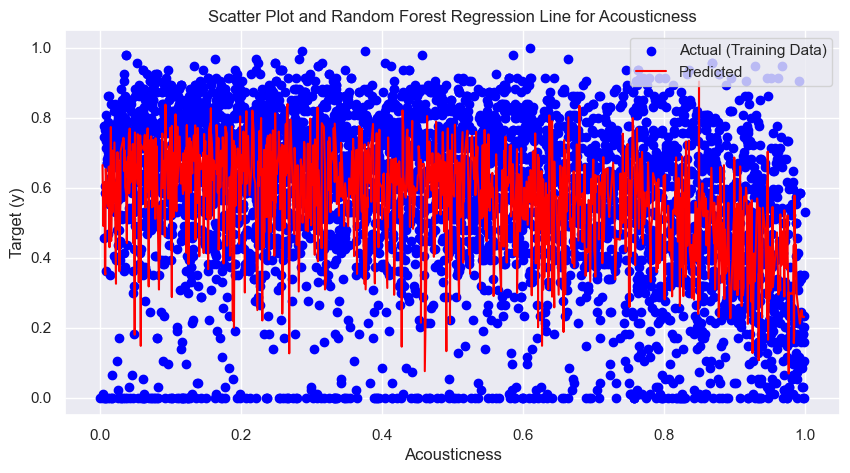

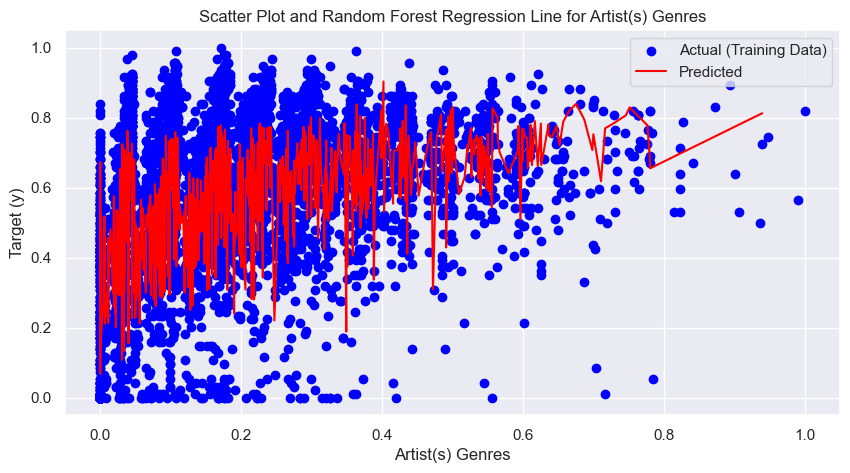

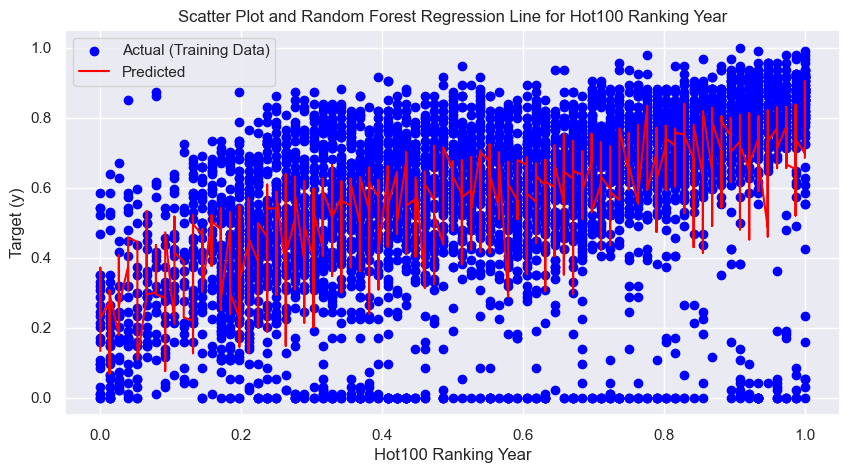

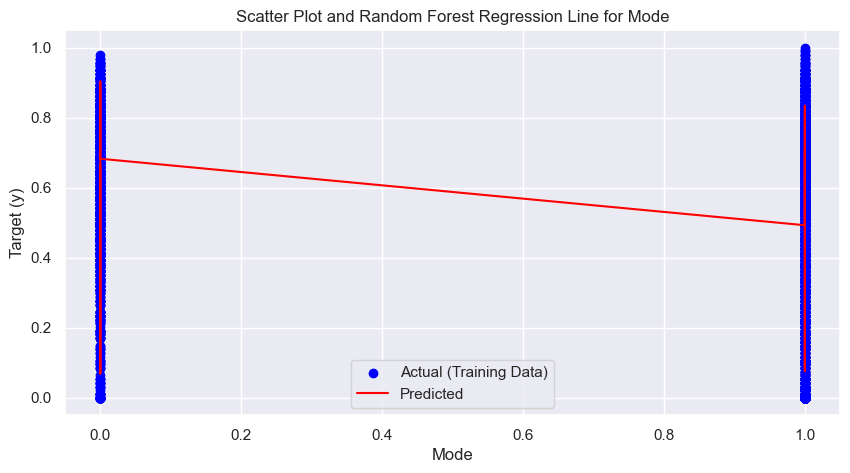

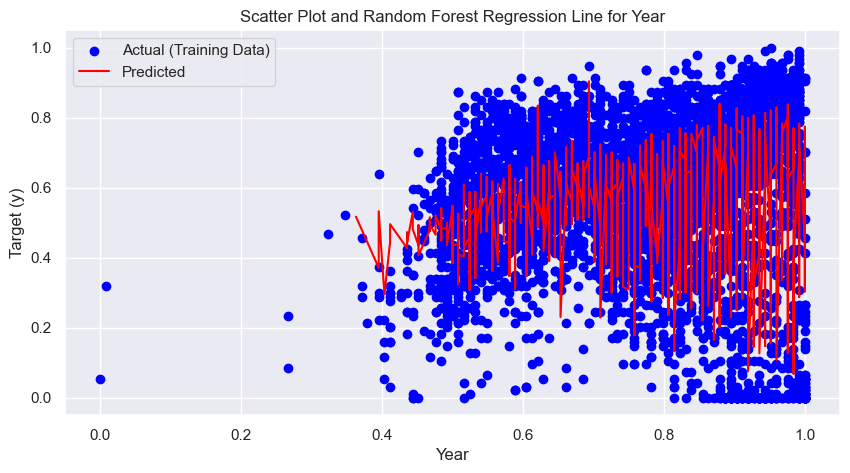

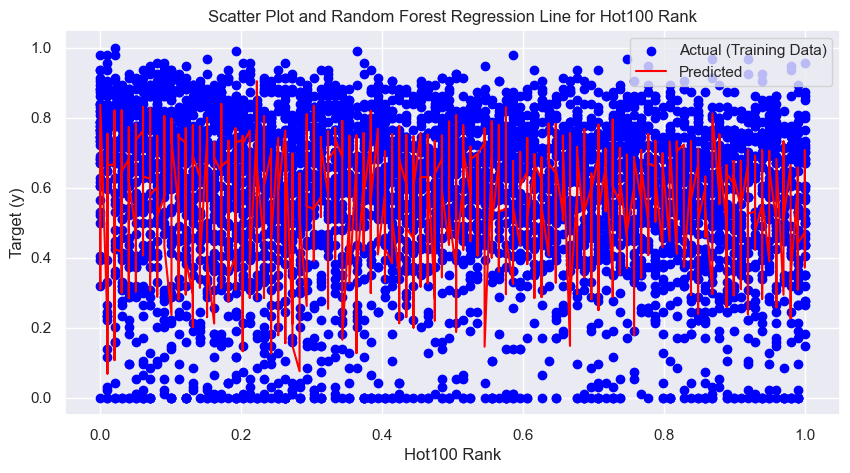

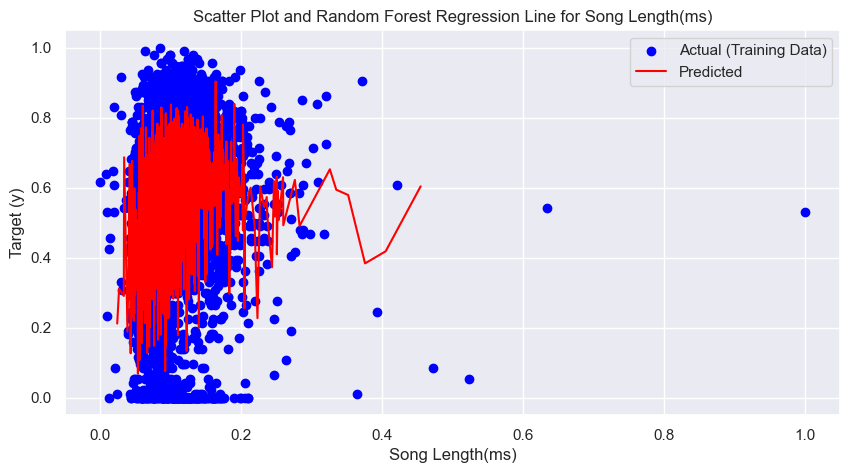

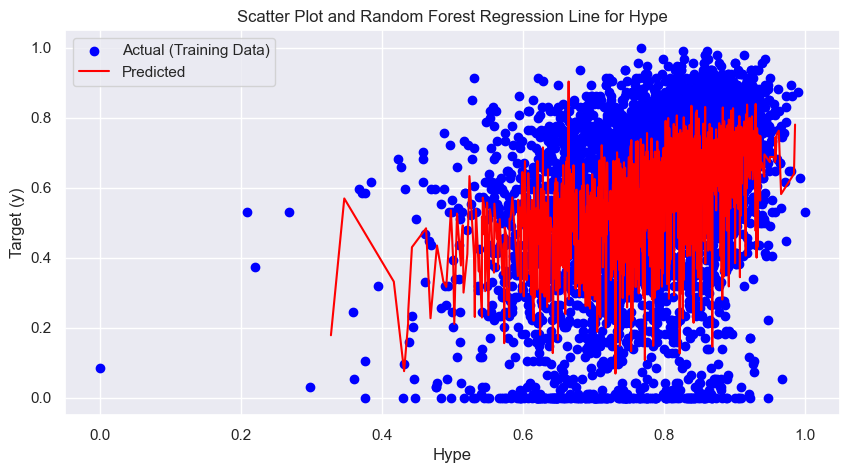

In [145]:
alphas = [0.001, 0.01, 0.1, 1.0, 10.0]

lasso = Lasso()

grid_search = GridSearchCV(estimator=lasso, param_grid={'alpha': alphas}, cv=5, scoring='neg_mean_squared_error', verbose=1)

grid_search.fit(X_train, y_train)

best_alpha = grid_search.best_params_['alpha']
best_mse = -grid_search.best_score_
LR=grid_search.best_estimator_

print("Best alpha:", best_alpha)
print("Best MSE:", best_mse)

test_mse = -grid_search.score(X_test, y_test)
print("Test MSE:", test_mse)
kf = KFold(n_splits=10, shuffle=True, random_state=1)

scores = cross_val_score(LR, X_train_scaled, y_train, scoring='neg_mean_squared_error', cv=kf)
mean_score = -np.mean(scores)
std_score = np.std(scores)
print("Mean Score:", mean_score)
print("Standard Deviation Score:", std_score)


LR.fit(X_train_scaled,y_train)
y_pred=LR.predict(X_test_scaled)

MSE=mean_squared_error(y_test,y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error = " , MSE)
print("Root Mean Squared Error = ",rmse)
print("Mean absolute Error = ",mae)
print("R2_score = ",r2)

for i, feature in enumerate(selected_features):
    plt.figure(figsize=(10, 5))
    plt.scatter(X_train[feature], y_train, color='blue', label='Actual (Training Data)')

    sorted_indices = X_test[feature].argsort()

    plt.plot(X_test[feature][sorted_indices], y_pred[sorted_indices], color='red', label='Predicted')

    plt.title(f'Scatter Plot and Random Forest Regression Line for {feature}')
    plt.xlabel(feature)
    plt.ylabel('Target (y)')
    plt.legend()
    plt.show()

# Ridge Regression

In [140]:
alphas = [0.001, 0.01, 0.1, 1.0, 10.0]

ridge = Ridge()

grid_search = GridSearchCV(estimator=ridge, param_grid={'alpha': alphas}, cv=5, scoring='neg_mean_squared_error', verbose=1)

grid_search.fit(X_train, y_train)

best_alpha = grid_search.best_params_['alpha']
best_mse = -grid_search.best_score_
RR=grid_search.best_estimator_
print("Best alpha:", best_alpha)
print("Best MSE:", best_mse)

test_mse = -grid_search.score(X_test, y_test)
print("Test MSE:", test_mse)


kf = KFold(n_splits=10, shuffle=True, random_state=10)

scores = cross_val_score(RR, X_train, y_train, scoring='neg_mean_squared_error', cv=kf,n_jobs=-1)
mean_score = -np.mean(scores)
std_score = np.std(scores)

print("Mean Score:", mean_score)
print("Standard Deviation Score:", std_score)

RR.fit(X_train, y_train)

y_pred = RR.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
RMSE = mean_squared_error(y_test, y_pred, squared=False)
MAE = mean_absolute_error(y_test, y_pred)
R2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", MSE)
print("Root Mean Squared Error:", RMSE)
print("Mean Absolute Error:", MAE)
print("R2 Score:", R2)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: 0.1
Best MSE: 0.030642595833564545
Test MSE: 0.030770364610363327
Mean Score: 0.030694200932455847
Standard Deviation Score: 0.0025640225125444704
Mean Squared Error: 0.030770364610363327
Root Mean Squared Error: 0.17541483577612052
Mean Absolute Error: 0.1279716694869285
R2 Score: 0.4264723921109502


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



# **Summary of Findings**
After comprehensive exploration and analysis of the song dataset, the top-performing model was identified as the **XGBoost Regression**, which achieved a notable r2 score of **0.664**.